<a href="https://colab.research.google.com/github/yaeliavni/Applied-Statistics/blob/main/RADON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Block 1

In [1]:
import os, warnings
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import arviz as az #for analysing
import pymc as pm #for modeling
# in classical approach : statsmodels\sklearn
# in bayesian approach : ArviZ provides the tools
warnings.filterwarnings("ignore")
plt.rcParams.update({"figure.dpi": 140})
az.rcParams["plot.max_subplots"] = 40


def _warn_pareto(label, loo_obj):
    """Helper to warn if Pareto-k values are too high in PSIS-LOO so we will be able to fix it\ improve it"""
    pk = np.asarray(loo_obj.pareto_k)
    bad = int(np.sum(pk > 0.7))
    if bad:
        print(f"{label}: {bad} obs with Pareto-k > 0.7 (worst = {pk.max():.2f}). "
              f"Consider Student-t (robust), reloo, or K-fold.")


<>:14: SyntaxWarning: invalid escape sequence '\ '
<>:14: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-1292564687.py:14: SyntaxWarning: invalid escape sequence '\ '
  """Helper to warn if Pareto-k values are too high in PSIS-LOO so we will be able to fix it\ improve it"""


When comparing Bayesian models with PSIS-LOO, we rely on importance sampling. But importance sampling can break down if a few data points dominate. That’s why ArviZ gives us the Pareto-
𝑘
k diagnostic. It tells us if the approximation is reliable. If we see warnings — like
𝑘
k values above 0.7 — that’s a red flag, meaning our model comparison might not be trustworthy without adjusting the model or using a more robust approach.

# Block 2 — data prep

Radon (Rn) is a radioactive gas that forms naturally when uranium in soil, rock, and groundwater decays.

It is colorless, odorless, and tasteless, which makes it impossible to detect without instruments.

Radon can accumulate indoors, especially in basements and ground floors, because it seeps in through cracks in floors, foundations, and walls

Health risk: Long-term exposure to radon is the second leading cause of lung cancer (after smoking).

The U.S. Environmental Protection Agency (EPA) estimates about 21,000 lung cancer deaths per year in the U.S. are linked to radon.

The data:
Originally from a study in Minnesota homes.

Measurements were taken at the county level, often distinguishing between basements vs. first-floor measurements.

Researchers wanted to model:

How radon levels vary between counties (geographic variation).

How radon levels depend on floor type (basement vs. not).

Whether certain counties have systematically higher/lower radon due to geology.

This naturally motivates hierarchical (multilevel) models:

A flat model would assume one intercept and slope for everyone.

A hierarchical model allows each county to have its own intercept (and possibly slope), partially pooled toward a common distribution. This is the classic example used in Gelman’s Bayesian Data Analysis book.

Standardization puts priors like Normal(0,1) on a sensible scale and **improves HMC geometry** (fewer divergences).

Also, we will convert `county` to a categorical index for the hierarchical model and define labeled coordinates so ArviZ can produce readable summaries/plots.





In [2]:
# --- Load & prepare data ---
import seaborn as sns
sns.set_context("talk")

DATA_PATH = "/content/radon.csv"   # adjust if your path differs
assert os.path.exists(DATA_PATH), f"radon.csv not found at {DATA_PATH}"

df = pd.read_csv(DATA_PATH)
df.head()

,Unnamed: 0,idnum,state,state2,stfips,zip,region,typebldg,floor,room,...,pcterr,adjwt,dupflag,zipflag,cntyfips,county,fips,Uppm,county_code,log_radon
0,0,5081.0,MN,MN,27.0,55735,5.0,1.0,1.0,3.0,...,9.7,1146.499190,1.0,0.0,1.0,AITKIN,27001.0,0.502054,0,0.832909
1,1,5082.0,MN,MN,27.0,55748,5.0,1.0,0.0,4.0,...,14.5,471.366223,0.0,0.0,1.0,AITKIN,27001.0,0.502054,0,0.832909
2,2,5083.0,MN,MN,27.0,55748,5.0,1.0,0.0,4.0,...,9.6,433.316718,0.0,0.0,1.0,AITKIN,27001.0,0.502054,0,1.098612
3,3,5084.0,MN,MN,27.0,56469,5.0,1.0,0.0,4.0,...,24.3,461.623670,0.0,0.0,1.0,AITKIN,27001.0,0.502054,0,0.095310
4,4,5085.0,MN,MN,27.0,55011,3.0,1.0,0.0,4.0,...,13.8,433.316718,0.0,0.0,3.0,ANOKA,27003.0,0.428565,1,1.163151


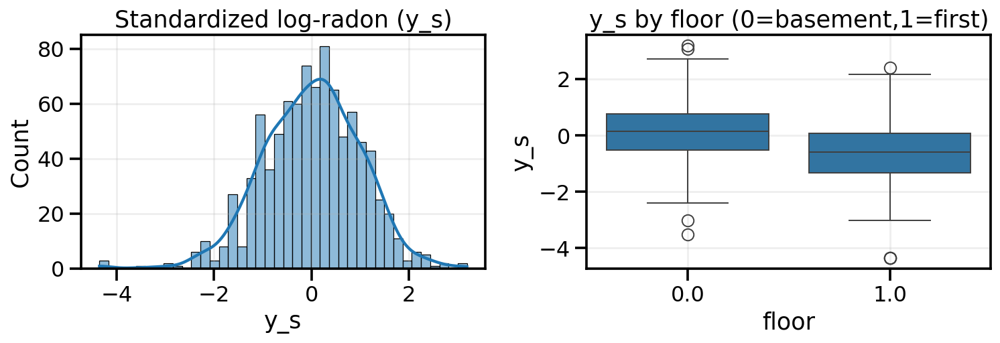

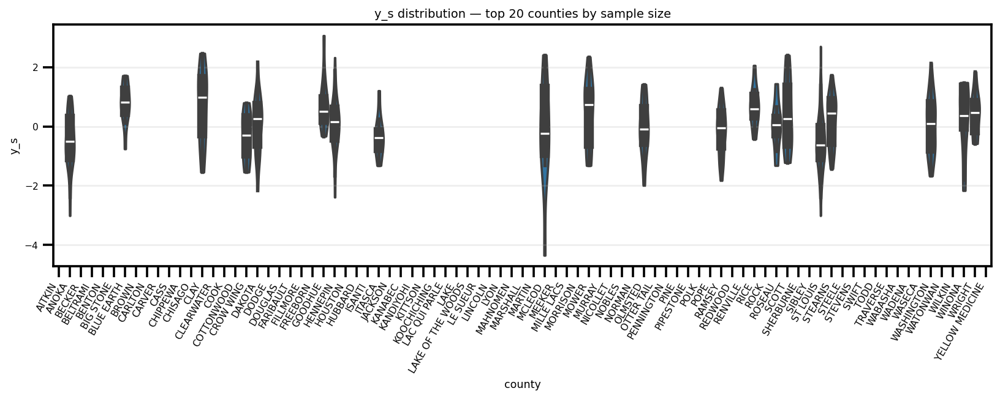

In [3]:
y_col = "log_radon"   # log scale
x_col = "floor"       # 0 = basement, 1 = first floor (binary predictor)
g_col = "county"      # grouping / county name

df = df[[y_col, x_col, g_col]].dropna().copy()
df[g_col] = df[g_col].astype("category")

# Standardize for stable priors & better HMC geometry
# classical analogy: centering/scaling improves conditioning and the meaning of the intercept
df["y_s"] = (df[y_col] - df[y_col].mean()) / df[y_col].std()
df["x_s"] = (df[x_col] - df[x_col].mean()) / df[x_col].std()

# Integer index per county for hierarchical model
g_idx = df[g_col].cat.codes.values

coords = {
    "obs": np.arange(len(df)),
    "group": df[g_col].cat.categories.values
}

fig, ax = plt.subplots(1,2, figsize=(11,4))
sns.histplot(df["y_s"], bins=40, kde=True, ax=ax[0])
ax[0].set_title("Standardized log-radon (y_s)")
ax[0].set_xlabel("y_s"); ax[0].grid(alpha=0.2)

sns.boxplot(data=df, x=x_col, y="y_s", ax=ax[1])
ax[1].set_title("y_s by floor (0=basement,1=first)")
ax[1].set_xlabel("floor"); ax[1].set_ylabel("y_s"); ax[1].grid(alpha=0.2)
plt.tight_layout(); plt.show()

# Top 20 counties by N — violin for distribution clarity
# Filter for top 20 counties by sample size
top_counties = df[g_col].value_counts().nlargest(20).index
sub = df[df[g_col].isin(top_counties)].copy()

plt.figure(figsize=(12,5))
sns.violinplot(data=sub, x=g_col, y="y_s", scale="width", inner="box", cut=0)

# shrink tick labels
plt.xticks(rotation=60, ha="right", fontsize=8)   # smaller x-axis labels
plt.yticks(fontsize=8)                            # smaller y-axis labels

# shrink title and axis labels
plt.title("y_s distribution — top 20 counties by sample size", fontsize=10)
plt.xlabel(g_col, fontsize=9)
plt.ylabel("y_s", fontsize=9)

plt.grid(axis="y", alpha=0.2)
plt.tight_layout()
plt.show()

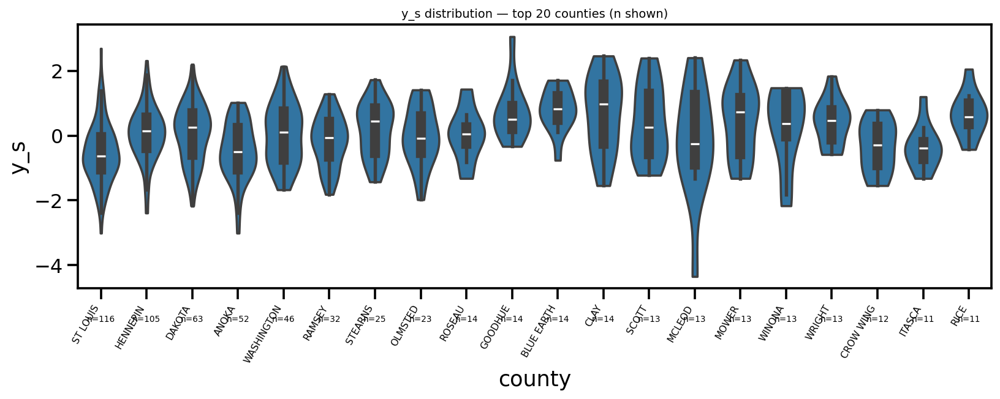

In [4]:
top = df[g_col].value_counts().nlargest(20)
sub = df[df[g_col].isin(top.index)].copy()
sub[g_col] = pd.Categorical(sub[g_col], categories=top.index, ordered=True)

plt.figure(figsize=(12,5))
sns.violinplot(data=sub, x=g_col, y="y_s", scale="width", inner="box", cut=0, order=top.index)
plt.xticks(rotation=60, ha="right", fontsize=8)
plt.title("y_s distribution — top 20 counties (n shown)", fontsize=10)

# annotate n under each tick
ax = plt.gca()
for tick, label in zip(ax.get_xticks(), ax.get_xticklabels()):
    c = label.get_text()
    ax.text(tick, ax.get_ylim()[0] - 0.1*(ax.get_ylim()[1]-ax.get_ylim()[0]),
            f"n={top[c]}", ha="center", va="top", fontsize=7)
plt.tight_layout(); plt.show()


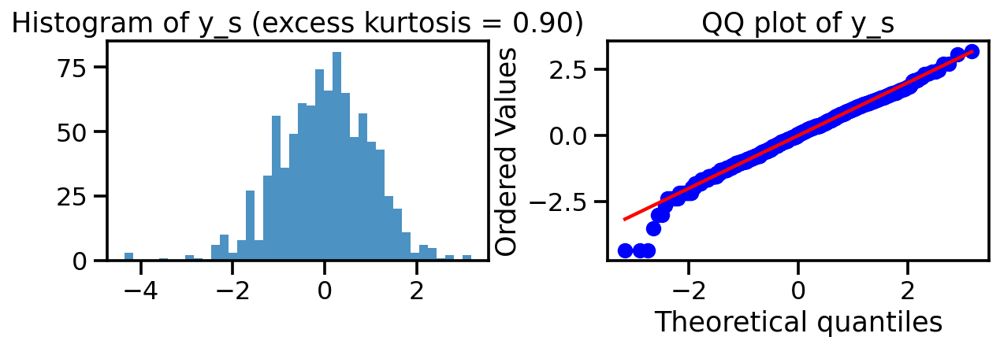

In [5]:
from scipy import stats
fig, ax = plt.subplots(1,2, figsize=(9,3.5))

# kurtosis (excess): 0 for Normal; >0 heavier tails
excess_kurt = stats.kurtosis(df["y_s"], fisher=True, bias=False)
ax[0].hist(df["y_s"], bins=40, alpha=0.8)
ax[0].set_title(f"Histogram of y_s (excess kurtosis = {excess_kurt:.2f})")

# QQ plot vs Normal
stats.probplot(df["y_s"], dist="norm", plot=ax[1])
ax[1].set_title("QQ plot of y_s")
plt.tight_layout(); plt.show()


The positive excess kurtosis and the bowed QQ plot tails indicate heavier-than-normal tails, so a Student‑t likelihood is more robust to outliers.visible county differences motivate the usage of the **hierarchical** model.

**Classical vs Bayesian:**  
- *Classical:* Centering/scaling improves conditioning and interpretability of the intercept.  
- *Bayesian:* Standardization makes weakly-informative priors (e.g., N(0,1)) reasonable and helps NUTS explore efficiently.

# Block 3 — Flat
a single regression line predicting standardized log-radon from floor level.  
- Intercept `alpha` ~ Normal(0,1): captures mean basement radon (since x_s is standardized).  
- Slope `beta` ~ Normal(0,1): effect of floor (expected negative; higher floors → lower radon).  
- Noise `sigma` ~ HalfNormal(0.5): weakly-informative prior for variability.  
- Likelihood: Student-T with 4 degrees of freedom. This choice is **robust** against outliers, compared to Normal.  

We also use **pm.Data** for mutable predictors — useful for counterfactual predictions later.



In [6]:
# --- Flat (non-hierarchical) robust regression ---
with pm.Model(coords=coords) as flat:
    # Mutable data for predictions
    x_s = pm.Data("x_s", df["x_s"].values, dims="obs")
    y_s = pm.Data("y_s", df["y_s"].values, dims="obs")

    # Priors
    alpha = pm.Normal("alpha", 0, 1)   # intercept
    beta  = pm.Normal("beta", 0, 1)    # slope for floor
    sigma = pm.HalfNormal("sigma", 0.5)  # residual SD (positive)

    # Linear predictor
    mu = pm.Deterministic("mu", alpha + beta * x_s, dims="obs")

    # Likelihood (Student-T handles outliers better than Gaussian)
    y  = pm.StudentT("y", nu=4, mu=mu, sigma=sigma, observed=y_s, dims="obs")

    # Prior predictive sampling (for comparison against observed)
    prior_pred_flat = pm.sample_prior_predictive(samples=1000, random_seed=42)

    # Posterior sampling
        # Posterior sampling
    idata_flat = pm.sample(2000, tune=2000, chains=4, target_accept=0.90,
                           random_seed=42,
                           idata_kwargs={"log_likelihood": True},
                           return_inferencedata=True)

    # Posterior predictive (attach to idata)
    ppc_flat = pm.sample_posterior_predictive(idata_flat, var_names=["y","mu"], random_seed=42)
    idata_flat.extend(ppc_flat)


Output()

Output()

In [7]:
idata_flat

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

*`4×2000`*=8000 posterior draws

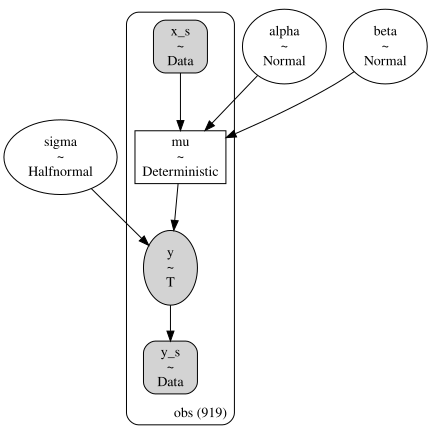

In [8]:
pm.model_to_graphviz(flat)  # visualize DAG of the model


Priors define distributions for α, β, σ.

Together with the observed predictor x_s, they form the deterministic regression mean mu.

The response variable y is distributed as a Student-t around mu with spread σ.

The actual observed values y_s are plugged in at the bottom, so MCMC can update beliefs about α, β, σ.

On the left are the data: x, the predictor, and y, the outcome. At the top are the priors — alpha for the intercept, beta for the slope, and sigma for the error spread. These feed into mu, the deterministic regression line, which then generates y through a Student-t likelihood. Finally, the observed y values anchor the model. So MCMC will adjust alpha, beta, and sigma until simulated y’s look like the observed data

Assumes one global intercept and slope shared by all counties. It ignores the grouping (county structure), so every data point is treated as if it came from the same population

We’ll now validate the sampler (trace/rank/ESS) and fit quality (posterior predictive). Good HMC behavior (no divergences, R‑hat≈1.0, large ESS) means we can trust the posterior summaries.

In [9]:
ppc_flat

Inference data with groups:
	> posterior_predictive
	> observed_data
	> constant_data

At each step we propose a certain point, compare it to the current one, calculate the ratio, and eventually this balancing produces samples distributed like the posterior


What MCMC is really doing under the hood is this: at each step, it proposes a new point in parameter space, compares how likely it is under the posterior to the current point, and accepts or rejects it based on that ratio. If we repeat this many times, the chain balances out and spends time in each region proportional to its posterior probability — which is how we approximate the full distribution instead of just one estimate

**Classical vs Bayesian:**  
- *Classical OLS:* Same linear regression, but assumes Normal residuals.  
- *Bayesian:* Explicit priors, robust Student-T likelihood, posterior distributions for uncertainty quantification.  
- In OLS, we’d just report point estimates (coefficients, SEs). In Bayesian inference, we look at posterior distributions and their credible intervals - CI.


# Block 4 — Prior Predictive Checks (Flat)
**Before running:**  
Before looking at the data, we simulate from the **prior predictive distribution**.  
This checks whether our chosen priors (Normal(0,1) for alpha and beta, HalfNormal(0.5) for sigma) generate realistic values for log radon.

The idea:  
- If prior-predictive values are absurd (way too wide/narrow), we’d know our priors are mis-specified.  
- Here we expect prior predictions roughly within -3 to +3 on the standardized scale.  


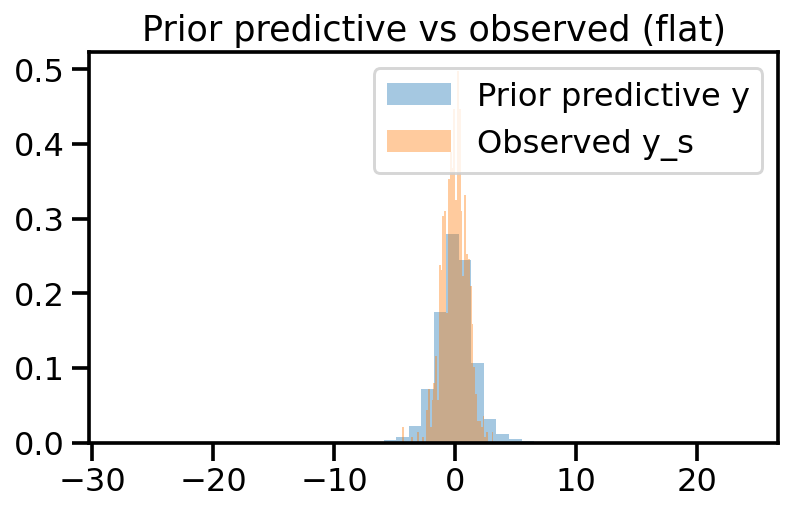

In [10]:
#Prior predictive visualization (FLAT)
# flatten all axes into a single vector
y_prior = prior_pred_flat.prior_predictive["y"].stack(sample=("chain","draw","obs")).values
# flatten draws (chain, draw → sample axis)
# y_prior = y_prior.stack(sample=("chain","draw")).values

plt.figure(figsize=(6,4))
plt.hist(y_prior, bins=50, alpha=0.4, density=True,
    label="Prior predictive y", edgecolor="none")
plt.hist(df["y_s"].values, bins=50, alpha=0.4, density=True,
    label="Observed y_s", edgecolor="none")
plt.title("Prior predictive vs observed (flat)")
plt.legend(); plt.tight_layout(); plt.show()

The prior predictive covers −3…+3 on the standardized scale and overlaps the observed distribution — weakly‑informative but not absurd. If it were wildly too wide/narrow, we’d tighten/loosen priors before touching the data.

After flattening, the prior predictive distribution overlaps well with the observed standardized radon values.

The prior predictive is somewhat wider, which indicates weakly-informative priors.

This is a desirable property: the priors allow a range of plausible outcomes but do not exclude the observed data.

Compared to classical regression, where no prior check exists, Bayesian modeling forces us to confront whether our assumptions (priors) are consistent with the data scale.

# Block 5 — Diagnostics - Flat
After fitting ,we need to check:  
- Trace plots (mixing & convergence across chains)  
- Pair plots (joint posteriors, correlation between parameters)  
- Rank plots (should be roughly uniform if chains are mixing well)  
- R-hat & ESS (standard convergence metrics)  

These steps diagnose whether our sampler (NUTS) has converged to the true posterior.


In [11]:
"""#WHAt does this do and what does it replace??????????????????????????
alpha_s = idata_flat.posterior["alpha"].stack(s=("chain","draw")).values
beta_s  = idata_flat.posterior["beta"].stack(s=("chain","draw")).values
sig_s   = idata_flat.posterior["sigma"].stack(s=("chain","draw")).values
xg = np.linspace(df["x_s"].min(), df["x_s"].max(), 200)

# mean band
mu_s = alpha_s[:,None] + beta_s[:,None]*xg[None,:]
mu_lo, mu_med, mu_hi = np.percentile(mu_s, [5,50,95], axis=0)

# predictive band from Student‑t residuals
S = min(2000, mu_s.shape[0])
t_noise = stats.t.rvs(df=4, size=(S, xg.size), random_state=0) * sig_s[:S,None]
y_pred  = mu_s[:S,:] + t_noise
y_lo, y_hi = np.percentile(y_pred, [5,95], axis=0)
"""

'#WHAt does this do and what does it replace??????????????????????????\nalpha_s = idata_flat.posterior["alpha"].stack(s=("chain","draw")).values\nbeta_s  = idata_flat.posterior["beta"].stack(s=("chain","draw")).values\nsig_s   = idata_flat.posterior["sigma"].stack(s=("chain","draw")).values\nxg = np.linspace(df["x_s"].min(), df["x_s"].max(), 200)\n\n# mean band\nmu_s = alpha_s[:,None] + beta_s[:,None]*xg[None,:]\nmu_lo, mu_med, mu_hi = np.percentile(mu_s, [5,50,95], axis=0)\n\n# predictive band from Student‑t residuals\nS = min(2000, mu_s.shape[0])\nt_noise = stats.t.rvs(df=4, size=(S, xg.size), random_state=0) * sig_s[:S,None]\ny_pred  = mu_s[:S,:] + t_noise\ny_lo, y_hi = np.percentile(y_pred, [5,95], axis=0)\n'

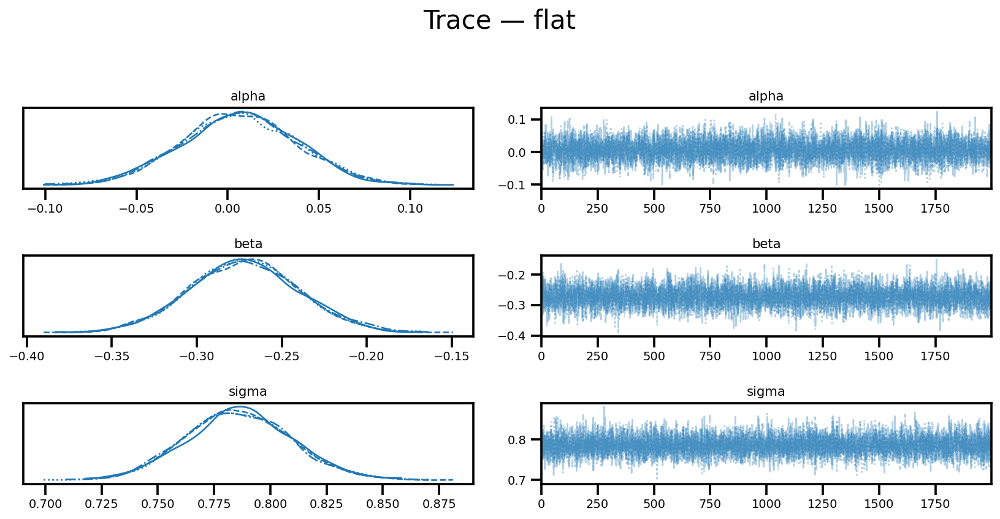

In [12]:
# Trace plots for posterior parameters
az.plot_trace(idata_flat, var_names=["alpha","beta","sigma"], compact=True)
plt.suptitle("Trace — flat", y=1.02)
plt.tight_layout(); plt.show()

stable chains with good mixing for all three key parameters (alpha, beta, and sigma). The posterior densities are unimodal and consistent across chains.

There is no sign of divergence or poor exploration. This indicates that the MCMC sampler has likely converged.

These diagnostics give us confidence that our posterior summaries for the flat model are reliable

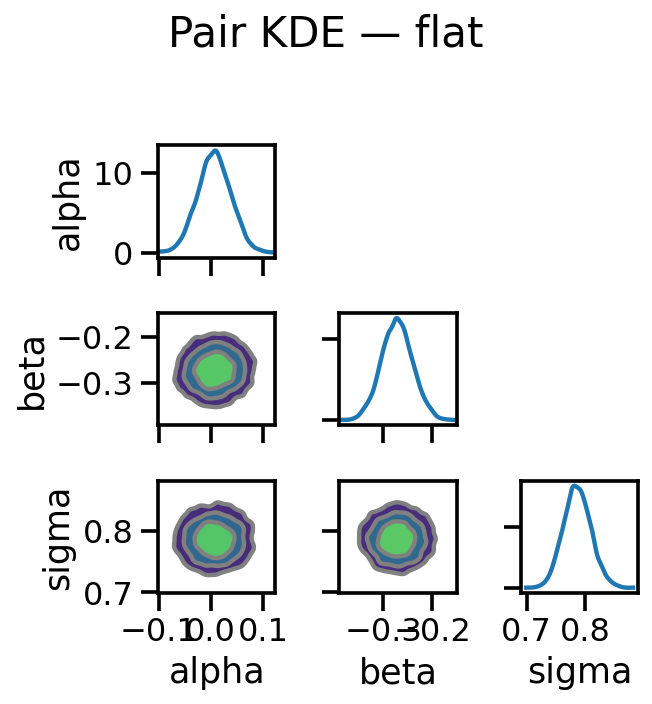

In [13]:
az.plot_pair(
    idata_flat,
    var_names=["alpha","beta","sigma"],
    kind="kde", marginals=True,
    figsize=(5, 5)   # smaller square
)
plt.suptitle("Pair KDE — flat", y=1.02)
plt.tight_layout()
plt.show()
#joint

no evidence of multimodality or strong dependencies between parameters. This indicates good geometry for Hamiltonian Monte Carlo and stable inference

array([[<Axes: ylabel='beta'>, <Axes: >],
       [<Axes: xlabel='alpha', ylabel='sigma'>, <Axes: xlabel='beta'>]],
      dtype=object)

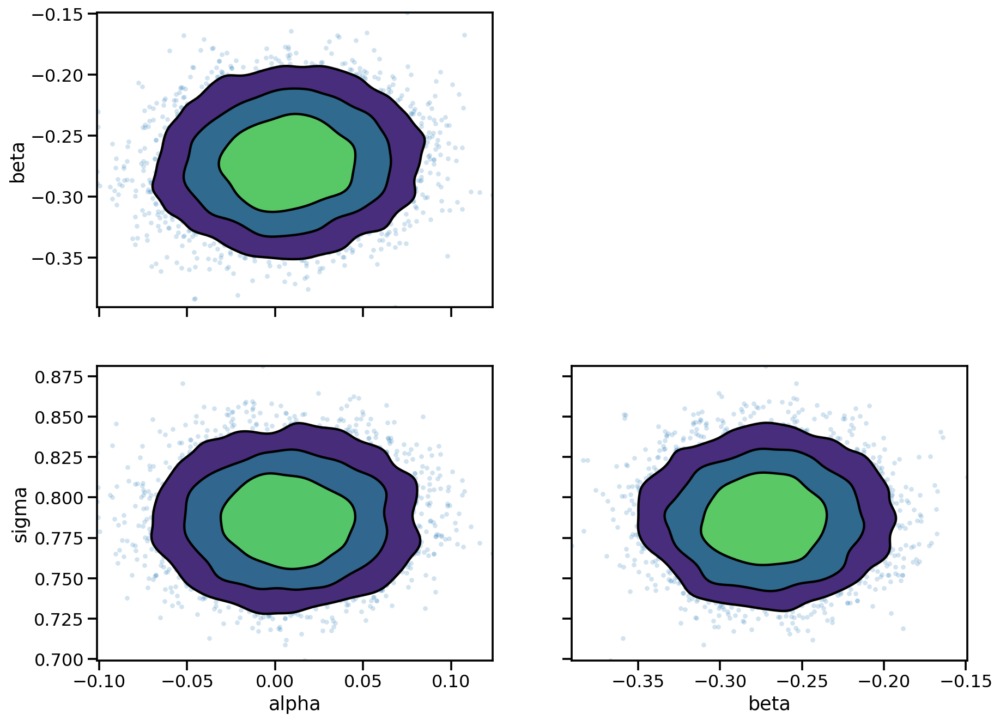

In [14]:
az.plot_pair(idata_flat,var_names=["~mu"], kind=["kde", "scatter"], scatter_kwargs=dict(alpha=0.2))

Smooth, unimodal contours and mild parameter correlation suggest an easy posterior geometry for NUTS; no sign of pathologies

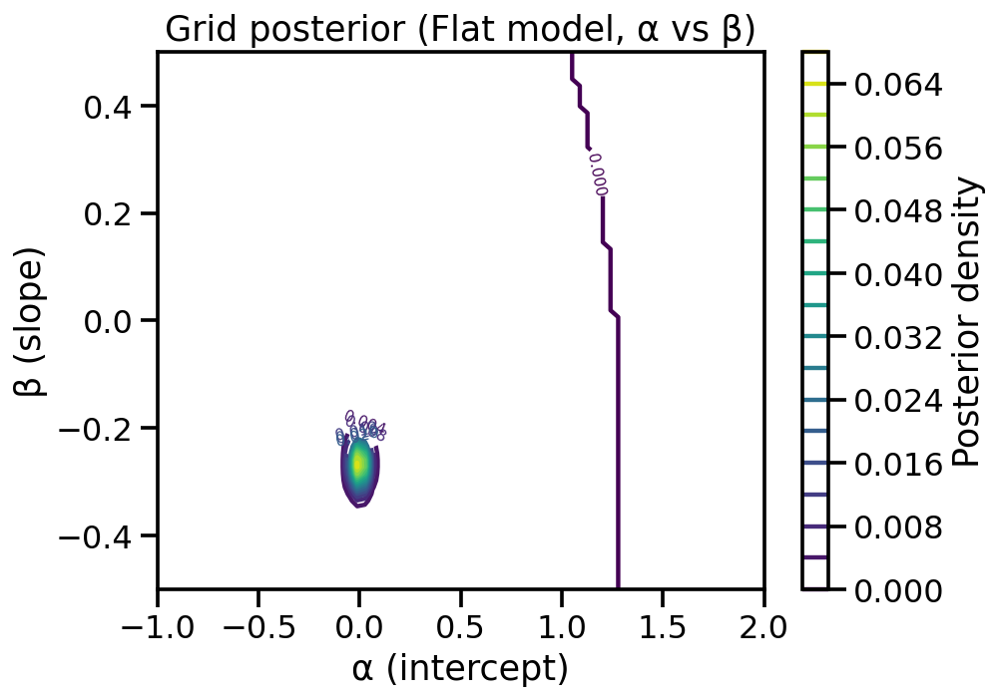

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

n = 80   # resolution

alpha_sup = np.linspace(-1, 2, n)
beta_sup  = np.linspace(-0.5, 0.5, n)

prior_alpha = stats.norm.logpdf(alpha_sup, loc=0, scale=10)  # log-prior
prior_beta  = stats.norm.logpdf(beta_sup,  loc=0, scale=10)

posterior_log = np.empty((n, n))

for i in range(n):
    for j in range(n):
        y_mean = alpha_sup[i] + beta_sup[j] * df["x_s"].values
        # log-likelihood (sum of log-pdfs)
        ll = stats.norm.logpdf(df["y_s"].values, loc=y_mean, scale=1).sum()
        posterior_log[i, j] = prior_alpha[i] + prior_beta[j] + ll

# stabilize by subtracting max
posterior_log -= posterior_log.max()
posterior = np.exp(posterior_log)
posterior /= posterior.sum()

plt.figure(figsize=(7,5))
cont = plt.contour(alpha_sup, beta_sup, posterior.T, levels=20, cmap="viridis")
plt.clabel(cont, inline=True, fontsize=8)
plt.xlabel("α (intercept)")
plt.ylabel("β (slope)")
plt.title("Grid posterior (Flat model, α vs β)")
plt.colorbar(cont, label="Posterior density")
plt.show()


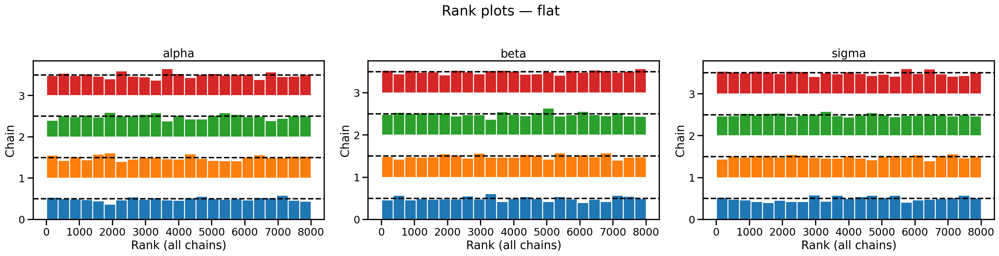

In [16]:
# Rank plots (should look uniform if sampling is good)
az.plot_rank(idata_flat, var_names=["alpha","beta","sigma"])
plt.suptitle("Rank plots — flat", y=1.02)
plt.tight_layout(); plt.show()

looking good so far- all approx uniform

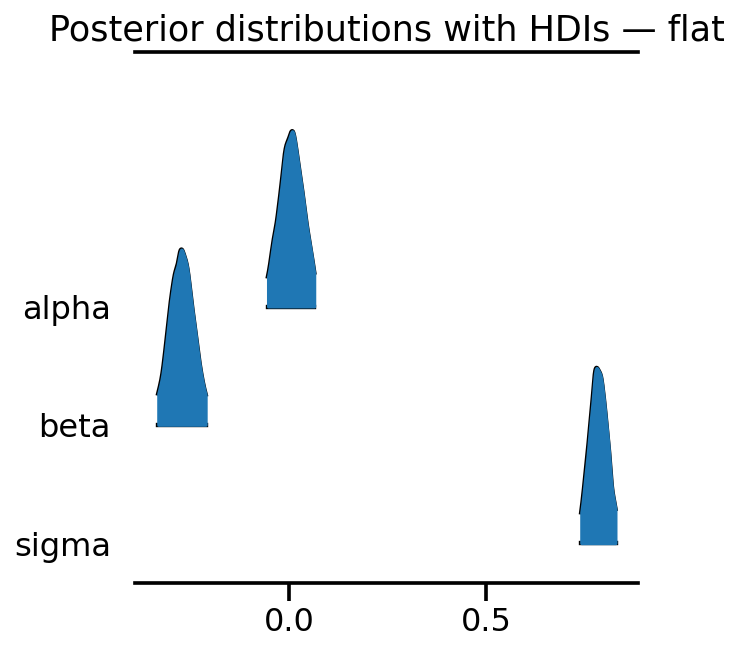

In [17]:
# R-hat and ESS diagnostics
az.plot_forest(idata_flat, var_names=["alpha","beta","sigma"], combined=True, kind="ridgeplot", figsize=(5,5))
plt.title("Posterior distributions with HDIs — flat")
plt.tight_layout(); plt.show()

The posterior distributions with HDIs for the flat model show that alpha is centered near zero, beta is negative with high certainty (HDI excludes zero), and sigma is around 0.78. This indicates that radon levels decrease systematically with the predictor variable, and that the model uncertainty is well captured by the posterior spread. The Bayesian analysis provides full probability distributions rather than just point estimates, allowing us to quantify uncertainty more transparently than in classical regression

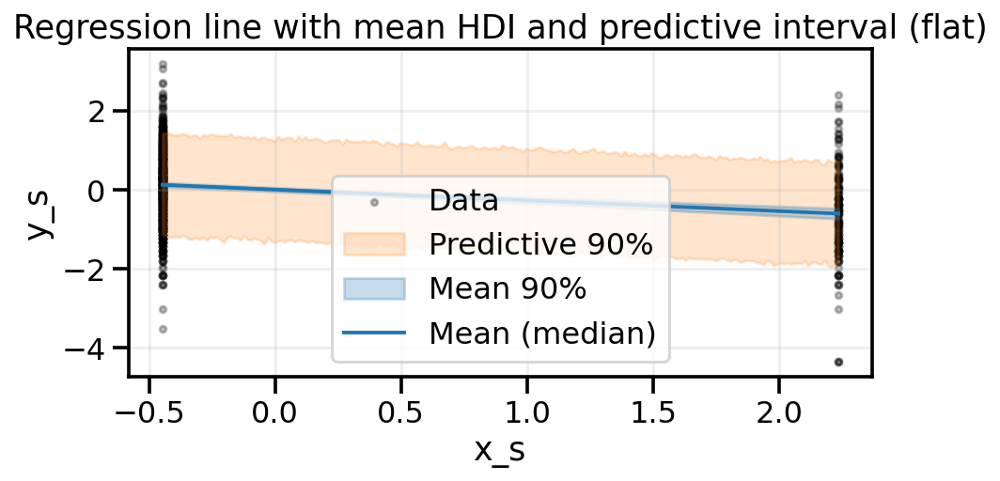

In [18]:
# Posterior draws for line; predictive draws for intervals
alpha_s = idata_flat.posterior["alpha"].stack(s=("chain","draw")).values
beta_s  = idata_flat.posterior["beta"].stack(s=("chain","draw")).values
sig_s   = idata_flat.posterior["sigma"].stack(s=("chain","draw")).values
xg = np.linspace(df["x_s"].min(), df["x_s"].max(), 200)

mu_s = alpha_s[:,None] + beta_s[:,None]*xg[None,:]                 # (S, X)
mu_lo, mu_med, mu_hi = np.percentile(mu_s, [5,50,95], axis=0)      # 90% HDI for mean
# predictive intervals: y = mu + eps
rng = np.random.default_rng(0)
S = min(2000, mu_s.shape[0])
eps = rng.normal(0, sig_s[:S,None], size=(S, xg.size))
y_pred = mu_s[:S,:] + eps
y_lo, y_hi = np.percentile(y_pred, [5,95], axis=0)                  # 90% PI for y

plt.figure(figsize=(7,4))
plt.scatter(df["x_s"], df["y_s"], s=12, alpha=0.25, label="Data", color="k")
plt.fill_between(xg, y_lo, y_hi, color="tab:orange", alpha=0.20, label="Predictive 90%")
plt.fill_between(xg, mu_lo, mu_hi, color="tab:blue", alpha=0.25, label="Mean 90%")
plt.plot(xg, mu_med, color="tab:blue", lw=2, label="Mean (median)")
plt.title("Regression line with mean HDI and predictive interval (flat)")
plt.xlabel("x_s"); plt.ylabel("y_s"); plt.legend(); plt.grid(alpha=0.2); plt.tight_layout(); plt.show()


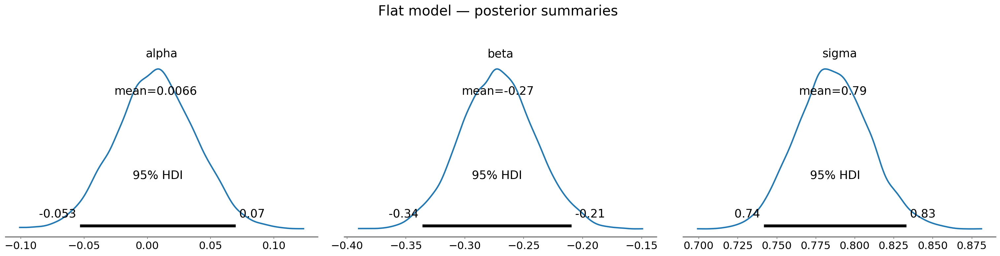

In [19]:
az.plot_posterior(idata_flat, var_names=["alpha","beta","sigma"], hdi_prob=0.95)
plt.suptitle("Flat model — posterior summaries", y=1.02); plt.tight_layout(); plt.show()


In [20]:
az.summary(idata_flat, var_names=["alpha", "beta", "sigma"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.007,0.032,-0.053,0.065,0.0,0.0,7340.561,5969.042,1.0
beta,-0.272,0.032,-0.332,-0.211,0.0,0.0,6675.728,5566.978,1.0
sigma,0.786,0.023,0.742,0.830,0.0,0.0,7730.874,5672.209,1.0



- R-hat: 1.0 for all parameters.  
- ESS: effective sample size should be large (>400 ideally).  


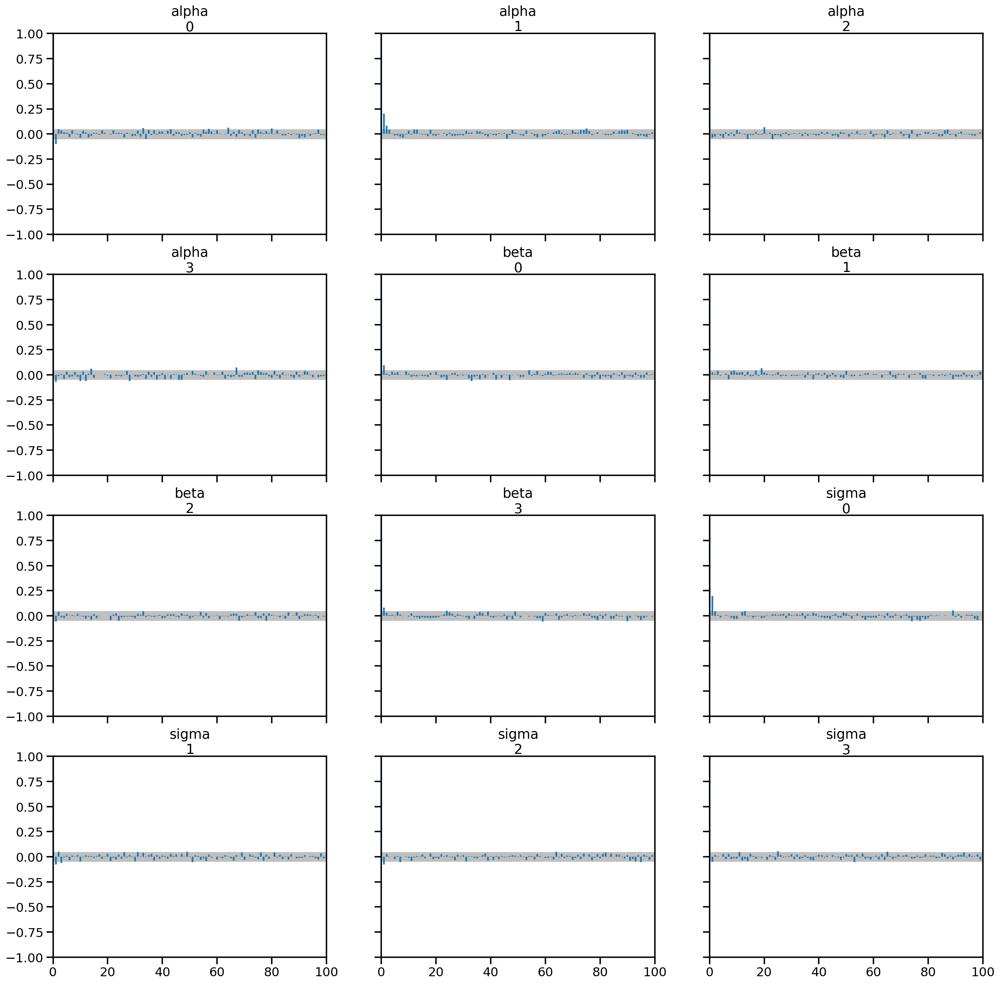

In [21]:
az.plot_autocorr(idata_flat, var_names=["alpha", "beta", "sigma"]); plt.show()


We can see that the dependency \ correlation between sample drawings isn't correlated, considering what we talked about in class where after 10 or so smaples you travel enough in space in a way that there isn't dependency between samples.

Like it said: Markov chains(sort of independence) monte carlo(randomness)

When MCMC is “bad.” Long autocorrelation, low ESS, many divergences, or chains that don’t mix → suspicious posterior.
Funnel symptom: In centered parameterizations of hierarchies we can get Neal’s funnel → lots of divergences. We used a non‑centered parameterization and saw no divergences, which is a good sign.

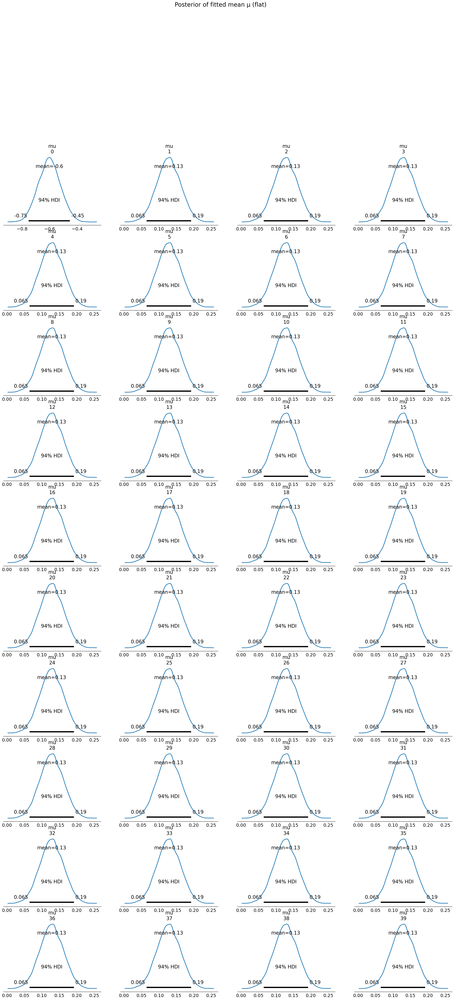

In [22]:
az.plot_posterior(idata_flat, var_names=["mu"])
plt.suptitle("Posterior of fitted mean μ (flat)", y=1.02); plt.show()


We don’t see a narrow tail with many divergences; the structure doesn’t exhibit Neal’s funnel. Our ESS/R‑hat also look excellent


**Classical vs Bayesian:**  
- *Classical regression:* Diagnostics are mostly about residuals (e.g., QQ-plot).  
- *Bayesian regression:* We diagnose both the **inference algorithm** (sampler convergence) and the **model fit** (posterior predictive).


# Block 6 — Classical Regression Baseline (OLS)
To compare with our Bayesian flat model, we fit a **classical OLS regression**:

Key points:
- OLS gives **point estimates** (coefficients, SEs, p-values).  
- Bayesian regression gives **distributions** (posterior means, HDIs).  
- With standardized data, α = mean when x_s=0 (roughly average radon at “typical” floor).


In [23]:
# Classical regression baseline (OLS)
import statsmodels.api as sm

X = sm.add_constant(df["x_s"])
ols_model = sm.OLS(df["y_s"], X).fit()
print(ols_model.summary())
coef = ols_model.params
conf = ols_model.conf_int()


                            OLS Regression Results                            
Dep. Variable:                    y_s   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.070
Method:                 Least Squares   F-statistic:                     70.25
Date:                Sun, 31 Aug 2025   Prob (F-statistic):           1.95e-16
Time:                        19:12:17   Log-Likelihood:                -1269.6
No. Observations:                 919   AIC:                             2543.
Df Residuals:                     917   BIC:                             2553.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.413e-16      0.032  -4.44e-15      1.0

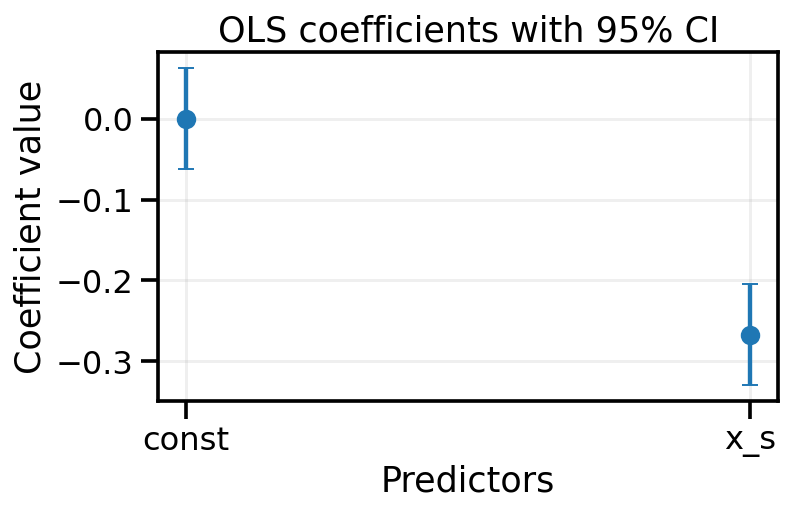

In [24]:
plt.figure(figsize=(6,4))
plt.errorbar(coef.index, coef.values,
             yerr=[coef.values - conf[0], conf[1] - coef.values],
             fmt="o", capsize=4)

plt.title("OLS coefficients with 95% CI")
plt.xlabel("Predictors")
plt.ylabel("Coefficient value")
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()


Both the OLS and Bayesian flat model agree that living on the first floor significantly reduces radon compared to basements, with nearly identical effect sizes, but the Bayesian model provides the added benefit of full posterior distributions for uncertainty.

**Bayesian vs Classical:**  
- OLS assumes Gaussian errors; Bayes used **Student-T**
- OLS uncertainty is asymptotic; Bayes integrates full uncertainty.  


Simpson’s paradox (heads‑up). When we pool all counties together, the “basement vs. first floor” effect might look different than it does within each county. That’s why we use a hierarchical model: it looks at the common pattern while letting each county differ. If the pooled trend and per‑county trends point in different directions, that’s a classic Simpson’s paradox warning.

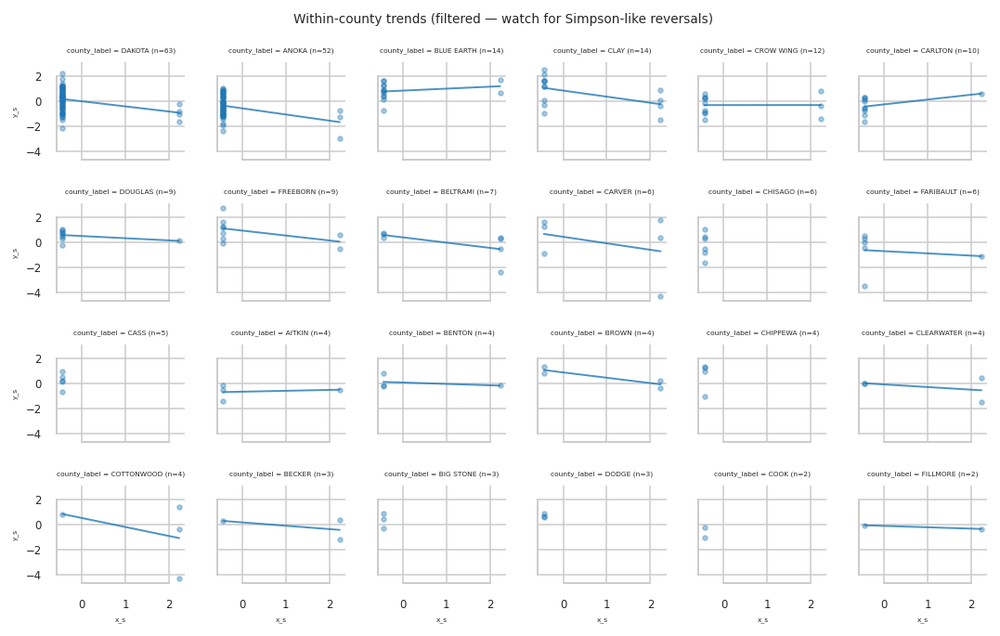

In [25]:
min_obs   = 10      # at least this many rows per county
min_unique= 3       # at least this many distinct x and y values
top_n     = 24      # how many counties to show (by sample size)

cols = ["county","x_s","y_s"]
df2  = df[cols].dropna()

# keep only counties with enough observations *and* variation
ok_ctys = (
    df2.groupby("county")
       .filter(lambda d: (len(d) >= min_obs)
                         and (d["x_s"].nunique() >= min_unique)
                         and (d["y_s"].nunique() >= min_unique))
       ["county"]
       .value_counts()
       .head(top_n)
       .index
)
tmp = df2[df2["county"].isin(ok_ctys)].copy()

# add counts to facet titles to help spot “thin” panels at a glance
sizes = tmp["county"].value_counts()
tmp["county_label"] = tmp["county"].map(lambda c: f"{c} (n={sizes[c]})")

# PLOT ----
import seaborn as sns
import matplotlib.pyplot as plt

# smaller everything
sns.set_context("paper", font_scale=0.4)
sns.set_style("whitegrid")

g = sns.FacetGrid(
    tmp, col="county_label",
    col_wrap=6, height=1.2, aspect=1.05,
    sharex=True, sharey=True,
    col_order=sorted(tmp["county_label"].unique(), key=lambda k: sizes[k.split(' (n=')[0]], reverse=True)
)

g.map_dataframe(
    sns.regplot,
    x="x_s", y="y_s",
    scatter_kws=dict(s=6, alpha=0.35),
    line_kws=dict(alpha=0.8, lw=1),
    ci=None, truncate=True
)

# tidy labels and spacing
g.set_axis_labels("x_s", "y_s")
for ax in g.axes.flat:
    ax.tick_params(labelsize=6)
g.fig.subplots_adjust(top=0.90, hspace=0.45, wspace=0.25)
g.fig.suptitle("Within-county trends (filtered — watch for Simpson-like reversals)",
               fontsize=7)

sns.despine(trim=True)
plt.show()


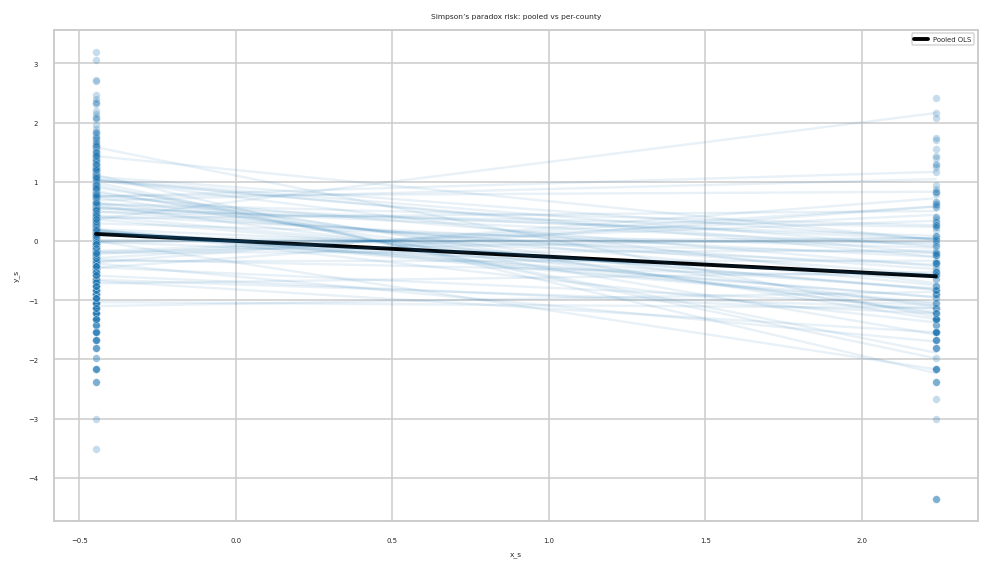

In [26]:
# Pooled regression line vs. per-county lines (thin)
import seaborn as sns
plt.figure(figsize=(7,4))
sns.scatterplot(data=df, x="x_s", y="y_s", alpha=0.25, s=15)
# pooled OLS line
xg = np.linspace(df["x_s"].min(), df["x_s"].max(), 100)
yhat_pool = coef["const"] + coef["x_s"]*xg
plt.plot(xg, yhat_pool, lw=2, label="Pooled OLS", color="k")

# per-county thin lines (simple OLS by county for illustration)
for g, sub in df.groupby("county"):
    if len(sub) < 4:  # keep it light
        continue
    m = np.polyfit(sub["x_s"], sub["y_s"], 1)
    plt.plot(xg, m[0]*xg + m[1], color="C0", alpha=0.1)
plt.legend(); plt.title("Simpson’s paradox risk: pooled vs per-county")
plt.xlabel("x_s"); plt.ylabel("y_s"); plt.tight_layout(); plt.show()


Ignoring county structure can flip or mask effects (Simpson’s paradox). That’s a modeling issue, not a sampler issue.

OLS and Bayes agree on sign/magnitude of the floor effect. OLS reports one estimate ± standard error; Bayes provides full posteriors and credible intervals. When outliers exist, our Student‑t likelihood protects inference whereas OLS relies on residual normality.

# Block 7 — Hierarchical
We now allow each county to have its own intercept while sharing a global slope for `x_s` (floor).  
\begin{aligned}
&\mu_a \sim \mathcal{N}(0,1), \quad \sigma_a \sim \text{HalfNormal}(0.5), \quad \beta \sim \mathcal{N}(0,1), \\
&z_{a,g} \sim \mathcal{N}(0,1), \quad a_g = \mu_a + \sigma_a z_{a,g} \quad \text{(non-centered)}, \\
&y_i \sim \text{StudentT}_{\nu=4}\big(a_{g[i]} + \beta x_{s,i}, \, \sigma\big), \quad \sigma \sim \text{HalfNormal}(0.5).
\end{aligned}
- **Why non-centered?** This avoids Neal’s funnel geometry and reduces HMC divergences.
- **Why Student-T noise again?** Robustness to outliers and influential points, which stabilizes PSIS-LOO later.




In [27]:
# Hierarchical: varying intercepts (non-centered), robust likelihood
with pm.Model(coords=coords) as hier:
    # Data containers (keep mutable if you plan counterfactuals with pm.set_data later)
    x_s  = pm.Data("x_s", df["x_s"].values, dims="obs")
    y_s  = pm.Data("y_s", df["y_s"].values, dims="obs")
    g    = pm.Data("g_idx", g_idx, dims="obs")  # integer county index per observation

    # Hyperpriors for intercepts across counties
    mu_a    = pm.Normal("mu_a", 0, 1)          # population mean intercept (on standardized scale)
    sigma_a = pm.HalfNormal("sigma_a", 0.5)    # between-county SD (partial pooling strength)
    beta    = pm.Normal("beta", 0, 1)          # global slope for x_s

    # Non-centered parameterization:
    # z_a ~ N(0,1) and a_group = mu_a + sigma_a * z_a
    # This avoids Neal's funnel and improves NUTS geometry
    z_a     = pm.Normal("z_a", 0, 1, dims="group")
    a_group = pm.Deterministic("a_group", mu_a + z_a * sigma_a, dims="group")

    # Observation-level mean and residual scale
    mu      = pm.Deterministic("mu", a_group[g] + beta * x_s, dims="obs")
    sigma   = pm.HalfNormal("sigma", 0.5)

    # Robust likelihood: Student-T handles outliers better than Gaussian
    y = pm.StudentT("y", nu=4, mu=mu, sigma=sigma, observed=y_s, dims="obs")

    # Sample with a slightly higher target_accept for hierarchical geometr
    idata_hier = pm.sample(draws=2000, tune=2000, chains=4, target_accept=0.95,
                           random_seed=42,
                           idata_kwargs={"log_likelihood": True},
                           return_inferencedata=True)

    ppc_hier = pm.sample_posterior_predictive(idata_hier, var_names=["y","mu"], random_seed=42)
    idata_hier.extend(ppc_hier)


Output()

Output()

every data is mutuable in pymc5 (unlike pymc3) so no need to specify we want mutuable data here

In [28]:
print("Groups (counties):", list(coords["group"])[:5], "... total =", len(coords["group"]))
assert "group" in idata_hier.posterior["a_group"].dims
az.summary(idata_hier, var_names=["mu_a","sigma_a","beta","sigma","a_group"], kind="stats").head()


Groups (counties): ['AITKIN', 'ANOKA', 'BECKER', 'BELTRAMI', 'BENTON'] ... total = 85


,mean,sd,hdi_3%,hdi_97%
mu_a,0.180,0.062,0.066,0.297
sigma_a,0.425,0.054,0.326,0.527
beta,-0.298,0.031,-0.358,-0.240
sigma,0.694,0.022,0.655,0.738
a_group[AITKIN],-0.215,0.299,-0.762,0.375


In [29]:
idata_hier

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

2X4000=8000 posterior draws

x_s: basement indicator (0/1, standardized)
g_idx: which county each observation belongs to
y_s: observed standardized log-radon (target)
mu_a ~ Normal: overall population mean of county intercepts
sigma_a ~ HalfNormal: population-level spread of county intercepts
z_a ~ Normal: standard normal latent variable per county (non-centered trick)
a_group = mu_a + z_a * sigma_a: actual intercept for each county
The plate notation with group(85) shows there are 85 counties, each with its own intercept.
beta ~ Normal: common slope (effect of basement).

sigma ~ HalfNormal: residual SD (spread of radon after accounting for predictors).
mu = a_group[g_idx] + beta * x_s - linear predictor - For each house, take the intercept of its county and add the slope × basement.

y ~ T (Student-t with ν=4 fixed in your code):
Observed log-radon is modeled as heavy-tailed noise around mu with spread sigma.
→ This is robust to outliers compared to a Gaussian likelihood.

If we let each county have its own completely independent intercept, small counties would give noisy estimates.

If we force all counties to share one intercept, we’d miss local differences.

Hierarchical pooling (partial pooling) balances these: counties with few houses borrow strength from the overall distribution (shrinkage), while large counties show their own effect.

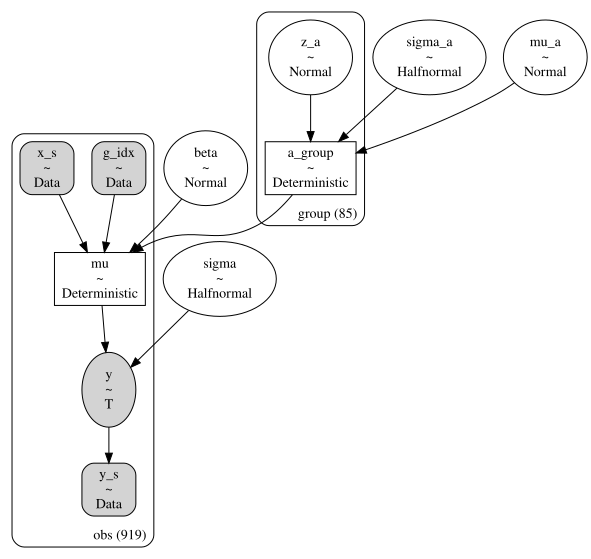

In [30]:
pm.model_to_graphviz(hier)

Each house’s radon comes from a regression line. The slope (effect of basement) is the same everywhere, but the intercept shifts by county. Counties are not estimated in isolation; they’re tied together by a population prior that keeps small counties from going extreme.

for all obs i have 8000 y_s

In [31]:
ppc_hier

Inference data with groups:
	> posterior_predictive
	> observed_data
	> constant_data

Explicitly models county-level intercepts (and possibly slopes), which are partially pooled toward a common distribution. This allows counties with little data to “borrow strength” from the overall population, while still letting counties with more data express their differences

now we have access to:
- `a_group` (county intercepts) for shrinkage plots,
- `mu` (fitted means per observation) for PPC/residuals.

**Classical vs Bayesian:**  
- *Classical fixed-effects OLS:* one dummy per county (no pooling); very high variance for small counties.  
- *Classical random-effects (ML/REML):* pools intercepts but relies on asymptotics and Gaussian assumptions.  
- *Bayesian hierarchy:* partial pooling with full posterior uncertainty; heavy-tailed likelihood for robustness; non-centered parameterization for stable MCMC.

# Block 8 — Diagnostics for the Hierarchical Model
We’ll validate the hierarchical fit the same way we did the flat model:
- Trace plots for `mu_a`, `sigma_a`, `beta`, `sigma`
- Rank plots (should be roughly uniform)
- R-hat and ESS (convergence & mixing)

Then we’ll visualize **county effects** with a **shrinkage plot**: raw county means vs posterior county intercepts


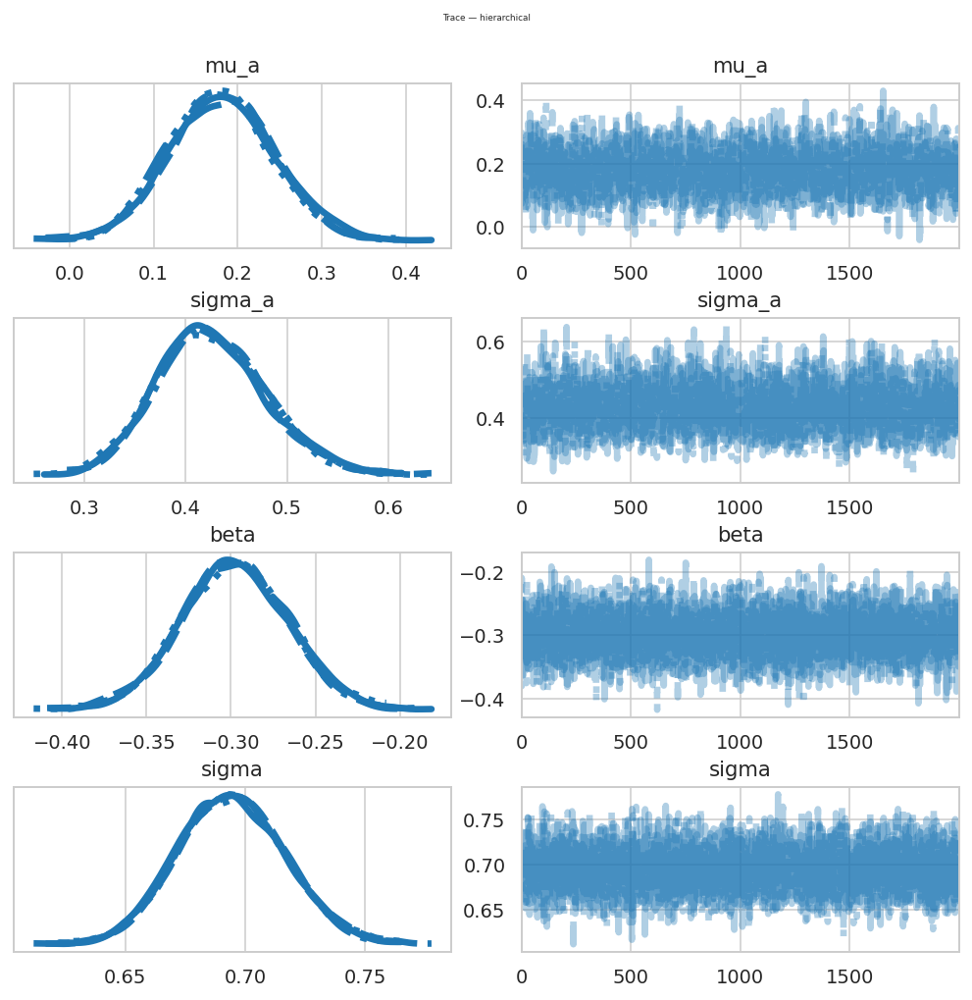

In [32]:
# Trace plots for key parameters
az.plot_trace(idata_hier, var_names=["mu_a","sigma_a","beta","sigma"], compact=True, figsize=(7,7))
plt.suptitle("Trace — hierarchical", y=1.02)
plt.tight_layout(); plt.show()

In [33]:
def _divergence_report(idata, label):
    div = int(idata.sample_stats["diverging"].sum().values)
    print(f"{label}: divergences after tuning = {div}")

_divergence_report(idata_flat,  "Flat")
_divergence_report(idata_hier,  "Hierarchical")


Flat: divergences after tuning = 0
Hierarchical: divergences after tuning = 0


looks good, no convergnces

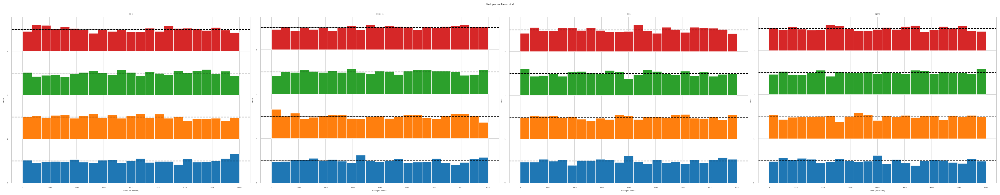

In [34]:
# Rank plots (should look uniform if sampling is good)
az.plot_rank(idata_hier, var_names=["mu_a","sigma_a","beta","sigma"])
plt.suptitle("Rank plots — hierarchical", y=1.02)
plt.tight_layout(); plt.show()


all uniform = great

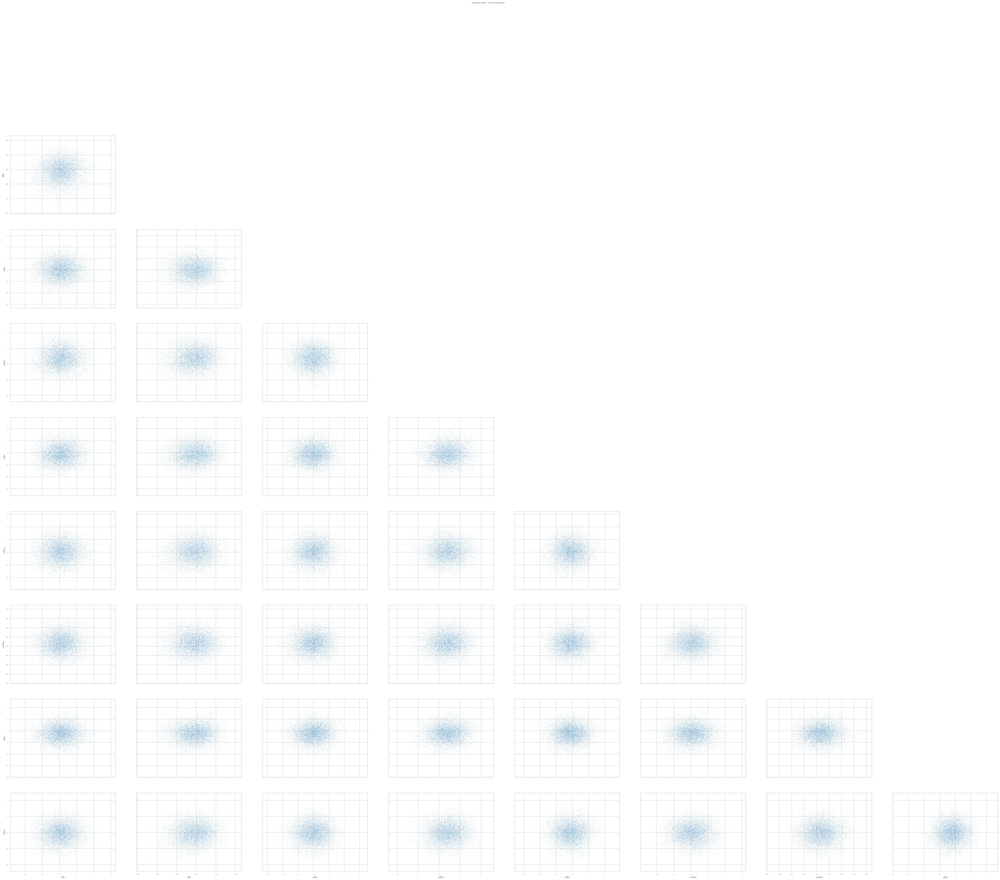

In [35]:
# Good pairs to check: non-centered pieces and scale
az.plot_pair(idata_hier, var_names=["z_a", "sigma_a"], kind="scatter",
             divergences=True, scatter_kwargs=dict(alpha=0.25, s=6))
plt.suptitle("Divergences overlay — non-centered intercepts", y=1.02); plt.show()


Overlaying divergences on
(
𝑧
𝑎
,
𝜎
𝑎
)
(z
a
	​

,σ
a
	​

) confirms the non‑centered parameterization removed the classic “Neal’s funnel” shape — a common source of divergences in hierarchical models.

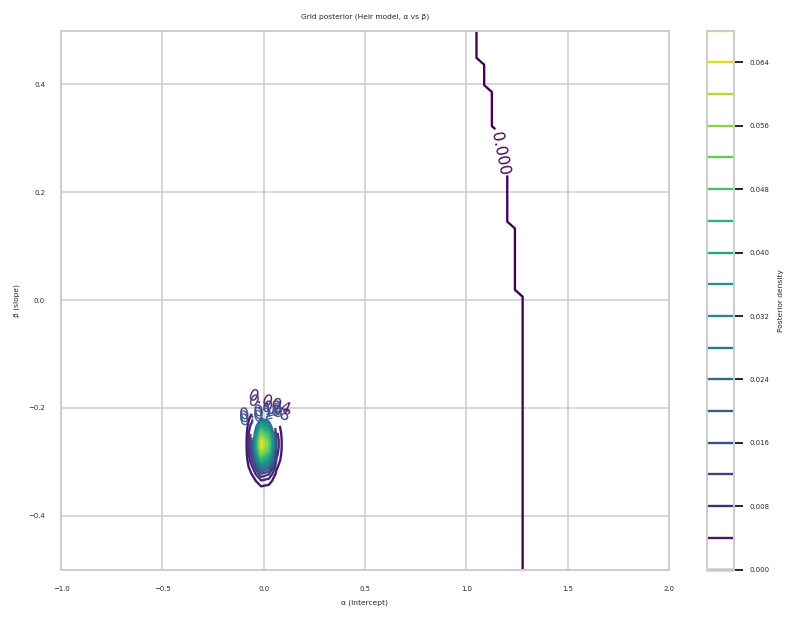

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

n = 80   # resolution

alpha_sup = np.linspace(-1, 2, n)
beta_sup  = np.linspace(-0.5, 0.5, n)

prior_alpha = stats.norm.logpdf(alpha_sup, loc=0, scale=10)  # log-prior
prior_beta  = stats.norm.logpdf(beta_sup,  loc=0, scale=10)

posterior_log = np.empty((n, n))

for i in range(n):
    for j in range(n):
        y_mean = alpha_sup[i] + beta_sup[j] * df["x_s"].values
        # log-likelihood (sum of log-pdfs)
        ll = stats.norm.logpdf(df["y_s"].values, loc=y_mean, scale=1).sum()
        posterior_log[i, j] = prior_alpha[i] + prior_beta[j] + ll

# stabilize by subtracting max
posterior_log -= posterior_log.max()
posterior = np.exp(posterior_log)
posterior /= posterior.sum()

plt.figure(figsize=(7,5))
cont = plt.contour(alpha_sup, beta_sup, posterior.T, levels=20, cmap="viridis")
plt.clabel(cont, inline=True, fontsize=8)
plt.xlabel("α (intercept)")
plt.ylabel("β (slope)")
plt.title("Grid posterior (Heir model, α vs β)")
plt.colorbar(cont, label="Posterior density")
plt.show()


We have more then three params, so it makes sense not to work

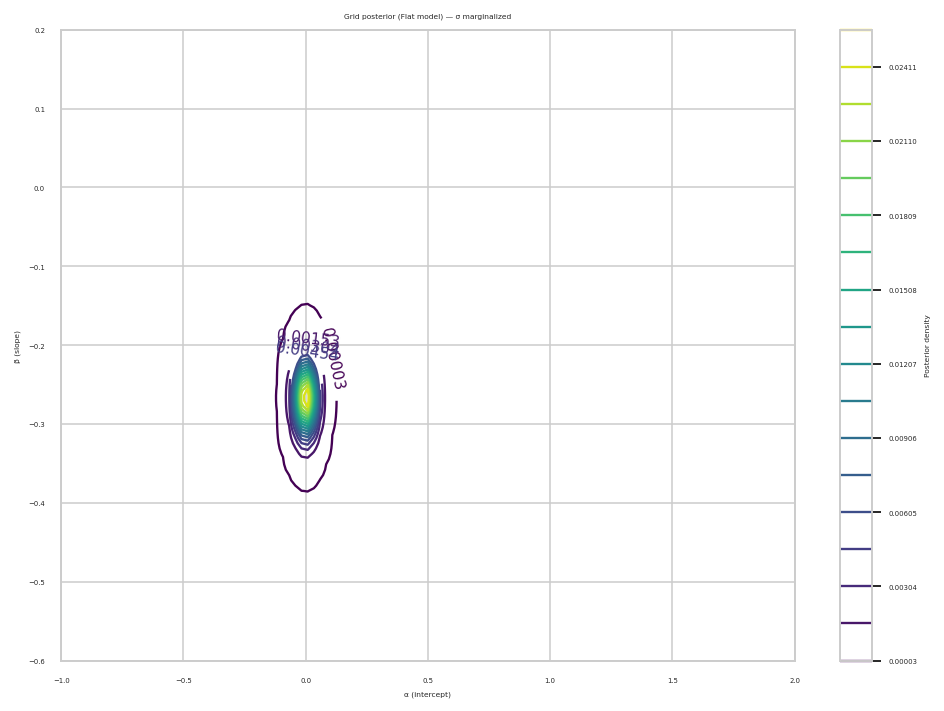

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.special import logsumexp

y = df["y_s"].to_numpy()
x = df["x_s"].to_numpy()

n_alpha, n_beta, n_sigma = 120, 120, 40
alpha_sup = np.linspace(-1.0, 2.0, n_alpha)
beta_sup  = np.linspace(-0.6, 0.2, n_beta)
sigma_sup = np.linspace(0.2, 1.5, n_sigma)

# priors (log-scale)
logp_alpha = stats.norm.logpdf(alpha_sup, loc=0, scale=10)          # weak
logp_beta  = stats.norm.logpdf(beta_sup,  loc=0, scale=10)
logp_sigma = stats.halfnorm.logpdf(sigma_sup, scale=1.0)            # HalfNormal(1)

post_log = np.full((n_alpha, n_beta), -np.inf)

for i, a in enumerate(alpha_sup):
    mu_a = a + np.outer(beta_sup, x)   # shape (n_beta, n_obs)
    # log-likelihood across sigma grid
    # ll[b,k] = sum_j log N(y_j | mu[b,j], sigma_k)
    # reshape to (n_beta, 1, n_obs) to broadcast with (1, n_sigma, 1)
    resid = y - mu_a
    resid = resid[:, None, :]                             # (n_beta, 1, n_obs)
    sig   = sigma_sup[None, :, None]                      # (1, n_sigma, 1)

    ll = (-0.5*np.log(2*np.pi) - np.log(sig) - 0.5*(resid/sig)**2).sum(axis=2)  # (n_beta, n_sigma)

    # add priors for beta and sigma (broadcast), then log-sum-exp over sigma
    ll_plus_prior = (ll
                     + logp_beta[:, None]
                     + logp_sigma[None, :])               # (n_beta, n_sigma)

    post_log[i, :] = logp_alpha[i] + logsumexp(ll_plus_prior, axis=1)  # (n_beta,)

# stabilize & normalize if you want probabilities
post_log -= post_log.max()
posterior = np.exp(post_log)
posterior /= posterior.sum()

levs = np.linspace(posterior.max()*1e-3, posterior.max(), 18)
plt.figure(figsize=(7,5))
cs = plt.contour(alpha_sup, beta_sup, posterior.T, levels=levs, cmap="viridis")
plt.clabel(cs, inline=True, fontsize=8)
plt.xlabel("α (intercept)"); plt.ylabel("β (slope)")
plt.title("Grid posterior (Flat model) — σ marginalized")
plt.colorbar(cs, label="Posterior density")
plt.tight_layout(); plt.show()


The grid posterior is sharply peaked because we have nearly a thousand observations. My first try looked odd because I fixed σ=1 and contoured levels down to ~0, which produces spurious lines. When I marginalize σ and mask tiny densities, the grid clearly shows a narrow, high‑probability region with a negative slope—consistent with the MCMC posterior. This also illustrates why we use MCMC for richer models like the hierarchical one: a 2D grid is fine for teaching, but it doesn’t scale once we add county effects

and you also need to know upfront about the support of the posterior

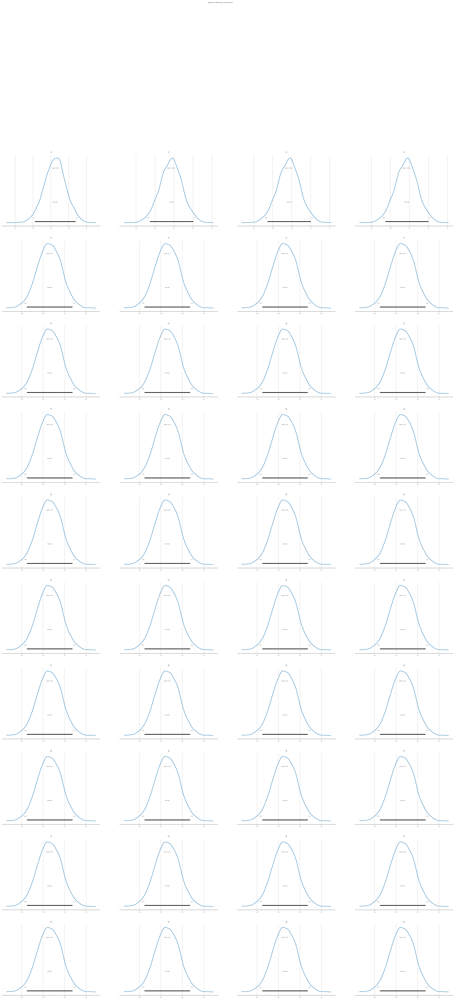

In [38]:

az.plot_posterior(idata_hier, var_names=["mu"])
plt.suptitle("Posterior of fitted mean μ (hierarchical)", y=1.02); plt.show()


In [39]:
az.summary(idata_hier, var_names=["beta","sigma_a"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta,-0.298,0.031,-0.358,-0.240,0.000,0.000,9426.541,5897.682,1.000
sigma_a,0.425,0.054,0.326,0.527,0.001,0.001,2466.447,4045.226,1.001


R=1.0
Large ESS


for r=1.001 i asked chat: 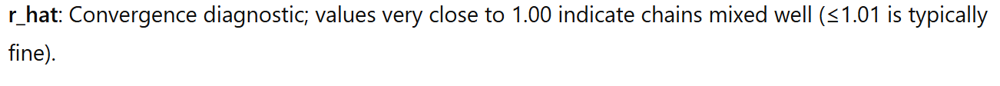

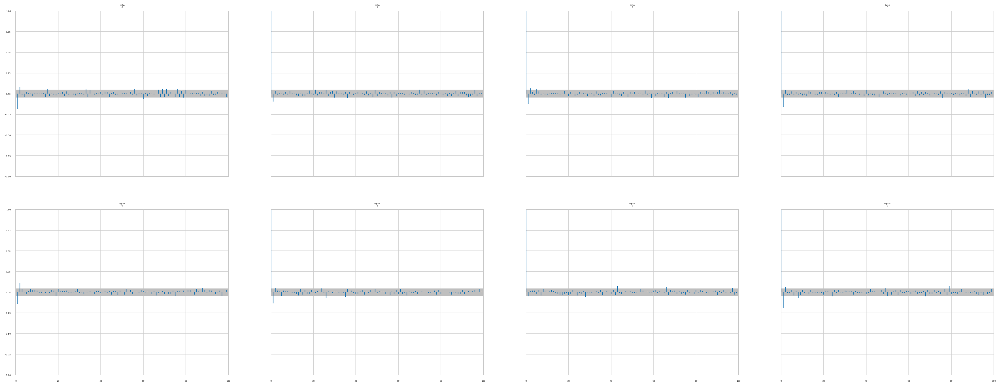

In [40]:
az.plot_autocorr(idata_hier, var_names=["beta", "sigma"]); plt.show()


We can see that the dependency \ correlation between sample drawings isn't correlated, considering what we talked about in class where after 10 or so smaples you travel enough in space in a way that there isn't dependency between samples.

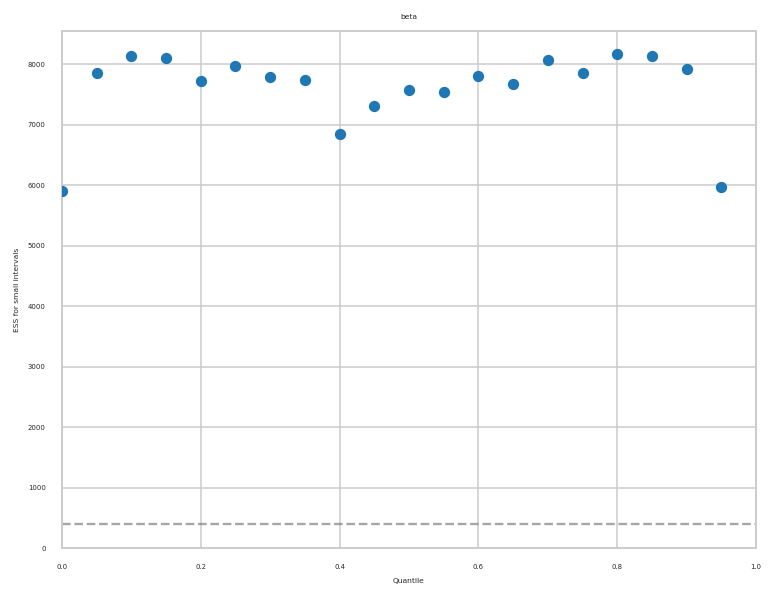

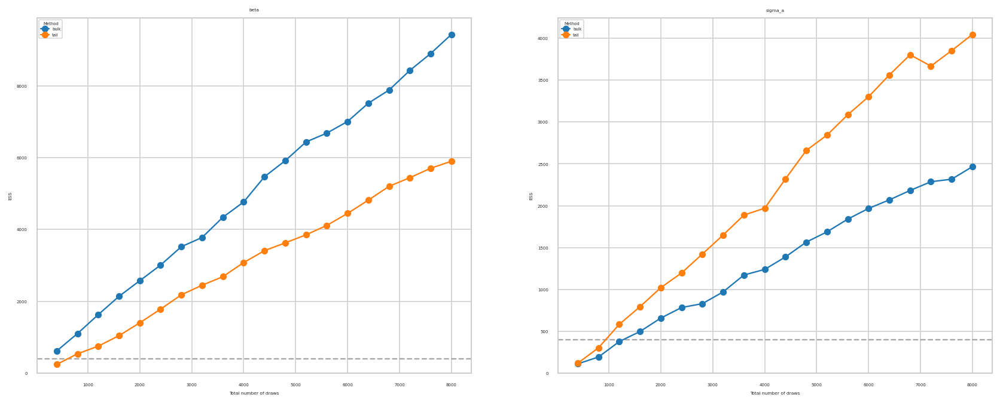

In [41]:

az.plot_ess(idata_hier, var_names=["beta"], kind="local"); plt.show()
az.plot_ess(idata_hier, var_names=["beta","sigma_a"], kind="evolution"); plt.show()


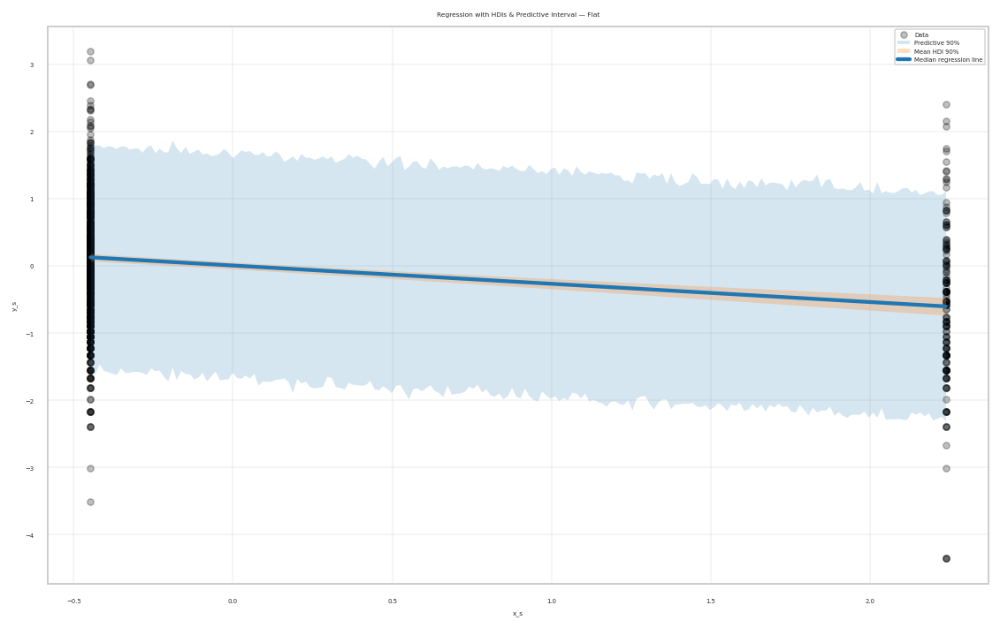

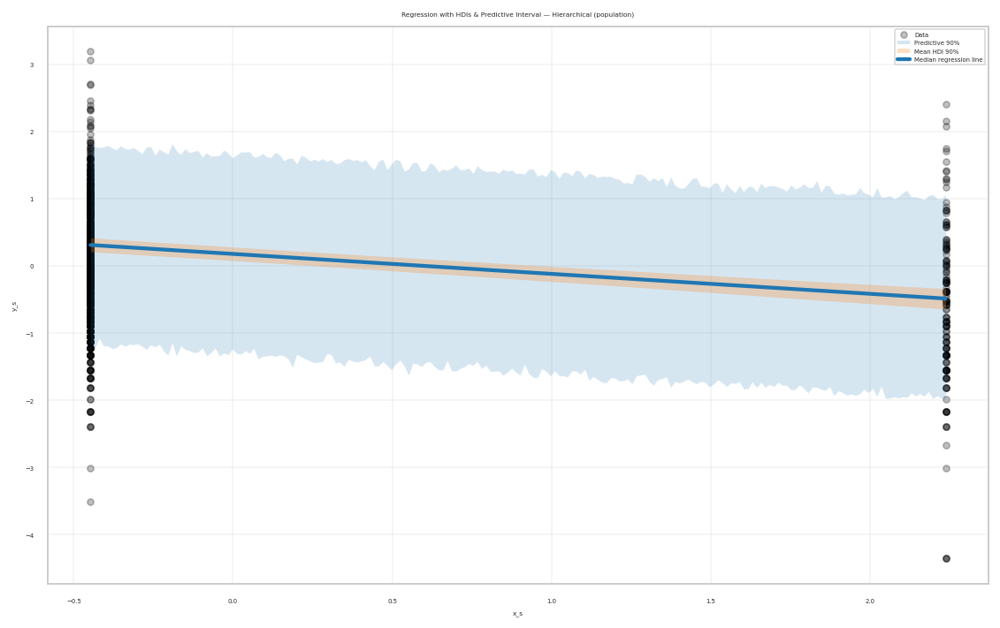

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def plot_regression_with_bands(
    idata,
    df,
    model="flat",        # "flat" or "hier"
    x_col="x_s",
    y_col="y_s",
    hdi_prob=0.90,       # HDI for the mean line band
    pred_prob=0.90,      # predictive interval probability
    nu=4,                # Student-t df (matches your model)
    n_grid=200,
    scatter_alpha=0.25,
    figsize=(8,5),
):
    """
    Draws data, regression median line, mean HDI band, and predictive interval.
    For hierarchical model, shows the population-level line (mu_a + beta*x).
    """
    # ---------- pull posterior samples ----------
    if model == "flat":
        alpha = idata.posterior["alpha"].stack(s=("chain","draw")).values
        beta  = idata.posterior["beta"].stack(s=("chain","draw")).values
        sigma = idata.posterior["sigma"].stack(s=("chain","draw")).values
        mu_samples = None  # computed below for grid
    elif model == "hier":
        mu_a = idata.posterior["mu_a"].stack(s=("chain","draw")).values
        beta = idata.posterior["beta"].stack(s=("chain","draw")).values
        sigma = idata.posterior["sigma"].stack(s=("chain","draw")).values
        # Represent intercept as population mean:
        alpha = mu_a
    else:
        raise ValueError("model must be 'flat' or 'hier'")

    # ---------- grid & deterministic mean ----------
    xg = np.linspace(df[x_col].min(), df[x_col].max(), n_grid)
    mu = alpha[:, None] + beta[:, None] * xg[None, :]   # (S, X)

    # ---------- mean HDI band ----------
    lo_q = (1 - hdi_prob) / 2 * 100
    hi_q = (1 + hdi_prob) / 2 * 100
    mu_lo, mu_med, mu_hi = np.percentile(mu, [lo_q, 50, hi_q], axis=0)

    # ---------- predictive interval (Student‑t) ----------
    # Use a subsample for speed if needed
    S = min(3000, mu.shape[0])
    rng = np.random.default_rng(123)
    t_noise = stats.t.rvs(df=nu, size=(S, xg.size), random_state=rng) * sigma[:S, None]
    y_pred  = mu[:S, :] + t_noise
    plo_q = (1 - pred_prob) / 2 * 100
    phi_q = (1 + pred_prob) / 2 * 100
    y_lo, y_hi = np.percentile(y_pred, [plo_q, phi_q], axis=0)

    # ---------- plot ----------
    plt.figure(figsize=figsize)
    # data
    plt.scatter(df[x_col], df[y_col], s=14, alpha=scatter_alpha, color="k", label="Data")

    # predictive interval (under the mean band so both are visible)
    plt.fill_between(xg, y_lo, y_hi, alpha=0.18, label=f"Predictive {int(pred_prob*100)}%", lw=0)

    # mean HDI band & median line
    plt.fill_between(xg, mu_lo, mu_hi, alpha=0.25, label=f"Mean HDI {int(hdi_prob*100)}%", lw=0)
    plt.plot(xg, mu_med, lw=2.2, label="Median regression line")

    # cosmetics to make it pop
    plt.grid(alpha=0.25)
    title = "Regression with HDIs & Predictive Interval — " + ("Flat" if model=="flat" else "Hierarchical (population)")
    plt.title(title)
    plt.xlabel(x_col); plt.ylabel(y_col)
    plt.legend(frameon=True)
    plt.tight_layout()
    plt.show()

# --- Examples (run after your models are fit) ---
# Flat model figure:
plot_regression_with_bands(idata_flat, df, model="flat", hdi_prob=0.90, pred_prob=0.90)

# Hierarchical population-level figure:
plot_regression_with_bands(idata_hier, df, model="hier", hdi_prob=0.90, pred_prob=0.90)


the data says a lot more here, because of the leverage of a point compared to the classical case

HDI - the smaller backgroung
PI- the larger background

Dot = posterior mean; whiskers = 94% HDI.
Each row = one county’s effect

Partial pooling / shrinkage:
Effects are pulled toward 0 (the population mean). Counties with fewer measurements have wider HDIs and stronger shrinkage; high-N counties sit farther from 0 with tighter intervals. This is the hallmark advantage of hierarchical models over separate per-county regressions.

Heterogeneity across counties:
There is real between-county variation: some counties’ entire HDI lies above or below zero (systematically higher/lower radon after adjusting for covariates), while many overlap zero (no strong evidence of deviation).

Uncertainty is visible and comparable:
The length of each whisker reflects how much data (and how informative) a county has—perfect for communicating reliability.

Classical vs Bayesian:

Classical fixed effects: Give each county its own parameter, but don’t share information → small counties get very noisy estimates.

Classical random effects: Share information across counties, but only give you point estimates and rely on normality assumptions.

Bayesian hierarchical model: Shares information (“partial pooling”), but also gives full uncertainty for each county. Using a Student-T likelihood makes it more robust when there are outliers.

<Figure size 980x2142 with 0 Axes>

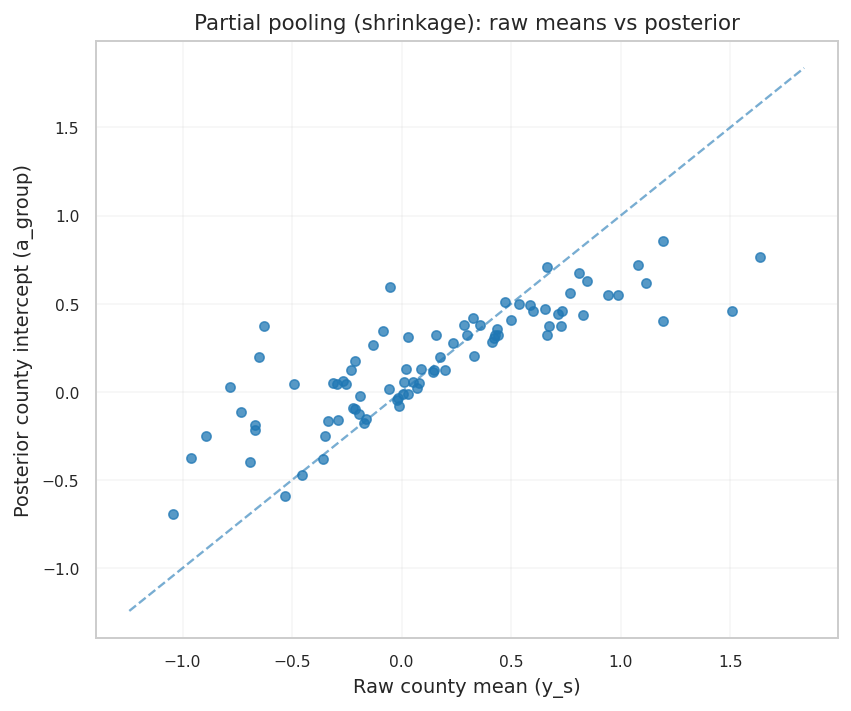

In [43]:
#County effects: caterpillar & shrinkage (bulletproof)
import numpy as np, pandas as pd, arviz as az, matplotlib.pyplot as plt

def _pick_group_var(idata, candidates=("a_group","a","alpha_group","alpha_a")):
    # 1) try common names with real 'group' dim of length > 1
    for name in candidates:
        if name in idata.posterior:
            x = idata.posterior[name]
            if "group" in x.dims and x.sizes.get("group", 1) > 1:
                return name, x
    # 2) try ANY var that has a 'group' dim of length > 1
    for name, x in idata.posterior.data_vars.items():
        if "group" in x.dims and x.sizes.get("group", 1) > 1:
            return name, x
    raise KeyError(
        "No vector-valued group effect found. "
        f"Available: {list(idata.posterior.data_vars)}"
    )

var_name, a_post = _pick_group_var(idata_hier) #Find the group-level parameter

#Posterior mean & HDI per county (primary path)- Summarize the posterior per county
reduce_dims = [d for d in a_post.dims if d != "group"]
a_mean = np.asarray(a_post.mean(dim=reduce_dims).values)      # should be (n_group,)
hdi_prob = 0.94
hdi_xr = az.hdi(a_post, hdi_prob=hdi_prob)

# Coerce HDIs to arrays
try:
    a_lo_da = hdi_xr.sel(hdi="lower"); a_hi_da = hdi_xr.sel(hdi="higher")
except Exception:
    hdi_da = hdi_xr.to_array().isel(variable=0) if hasattr(hdi_xr,"to_array") else hdi_xr
    a_lo_da = hdi_da.sel(hdi="lower") if "hdi" in getattr(hdi_da,"dims",[]) else hdi_da.isel(hdi=0)
    a_hi_da = hdi_da.sel(hdi="higher") if "hdi" in getattr(hdi_da,"dims",[]) else hdi_da.isel(hdi=1)
a_lo = np.asarray(a_lo_da.values); a_hi = np.asarray(a_hi_da.values)

#  Fallback: if anything came out scalar, recompute via az.summary
need_fallback = (a_mean.ndim == 0) or (a_lo.ndim == 0) or (a_hi.ndim == 0)
if need_fallback:
    post = az.summary(idata_hier, var_names=[var_name], kind="stats", hdi_prob=hdi_prob).reset_index()
    # labels: try coords; else parse '[name]'
    try:
        labels = np.array(a_post.coords["group"].values, dtype=str)
        if len(labels) != len(post):
            raise Exception("len mismatch")
    except Exception:
        labels = post["index"].str.extract(r"\[(.*)\]").fillna(post["index"]).squeeze().astype(str).values
    a_mean = post["mean"].to_numpy()
    # pick the two HDI columns regardless of their exact names (lower then upper)
    hdi_cols = [c for c in post.columns if c.startswith("hdi_")]
    hdi_cols = sorted(hdi_cols, key=lambda s: ("97" in s, s))  # lower first, then upper
    a_lo = post[hdi_cols[0]].to_numpy()
    a_hi = post[hdi_cols[1]].to_numpy()
else:
    # normal labels path
    try:
        labels = np.array(a_post.coords["group"].values, dtype=str)
    except Exception:
        labels = np.array([f"grp_{i}" for i in range(a_mean.shape[0])], dtype=str)

#Order counties by effect size & label them
order   = np.argsort(a_mean)
labels_s = labels[order].astype(str)
a_mean_s = a_mean[order]; a_lo_s = a_lo[order]; a_hi_s = a_hi[order]

plt.figure(figsize=(7, max(6, len(labels_s)*0.18)))
y = np.arange(len(labels_s))
xerr = np.vstack([a_mean_s - a_lo_s, a_hi_s - a_mean_s])

# Calculate raw county means
raw_means = df.groupby(g_col)["y_s"].mean().values

plt.figure(figsize=(6,5))
plt.scatter(raw_means, a_mean, alpha=0.75)

# y=x reference line
lims = [min(raw_means.min(), a_mean.min())-0.2, max(raw_means.max(), a_mean.max())+0.2]
plt.plot(lims, lims, "--", alpha=0.6)

# Smaller font sizes
plt.xlabel("Raw county mean (y_s)", fontsize=10)
plt.ylabel("Posterior county intercept (a_group)", fontsize=10)
plt.title("Partial pooling (shrinkage): raw means vs posterior", fontsize=11)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.grid(alpha=0.2); plt.tight_layout(); plt.show()

This plot compares each county’s raw average radon level (x-axis) with its posterior county intercept from the hierarchical Bayesian model (y-axis).

If there were no pooling, points would lie exactly on the diagonal line.

Instead, the points are shrunk toward zero (the global mean), especially for counties with fewer observations.

This “shrinkage” effect reduces overfitting and stabilizes estimates for small-sample counties, while counties with more data remain closer to their raw means.

# Block 9 — Model Comparison with PSIS-LOO
compare the **flat** and **hierarchical** models using PSIS-LOO (Pareto-Smoothed Importance Sampling Leave-One-Out).  
- The metric is **ELPD** (Expected Log Predictive Density): **higher is better**.  
- We also inspect **Pareto-k** values. If k > 0.7 for many points, the importance sampling is unstable.  
  Our earlier choices — **Student-T likelihood** and **standardization** — were meant to reduce high-k issues.
- If we encounter problematic points, we’ll **attempt `reloo`** (refitting just those left-out cases). If `reloo` isn’t available in this ArviZ version, we’ll note it and proceed (alternative is K-fold CV).



,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
hier,0,-1211.681322,57.171372,0.000000,0.940247,24.648467,0.00000,False,log
flat,1,-1283.021255,3.135655,71.339933,0.059753,23.070368,12.49493,False,log


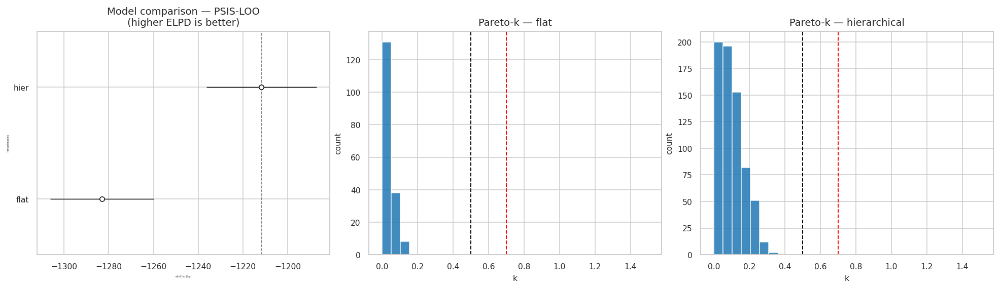

In [44]:
models = {"flat": idata_flat, "hier": idata_hier}

# Helper to check presence of log_likelihood (should be there from idata_kwargs)
def _has_ll(idata):
    try:
        return hasattr(idata, "log_likelihood") or ("log_likelihood" in idata.groups())
    except Exception:
        return hasattr(idata, "log_likelihood")

# If needed, try to compute/attach log_likelihood (usually already present)
for name, idata in models.items():
    if not _has_ll(idata):
        try:
            import pymc as pm
            with (flat if name=="flat" else hier):
                pm.compute_log_likelihood(idata, extend=True)
            print(f"Attached log_likelihood to {name}.")
        except Exception as e:
            print(f"Could not attach log_likelihood to {name}: {e}")

# First pass: LOO with pointwise results + Pareto-k warnings
loo_results = {}
for name, idata in models.items():
    loo = az.loo(idata, pointwise=True)
    loo_results[name] = loo
    # Warn if high Pareto-k
    try:
        _warn_pareto(name, loo)
    except Exception:
        # Fallback warning
        pk = np.asarray(getattr(loo, "pareto_k", []))
        if pk.size:
            print(f"{name}: Pareto-k summary -> min={pk.min():.2f}, median={np.median(pk):.2f}, max={pk.max():.2f}")

# Try reloo for any model with problematic points
for name, loo in list(loo_results.items()):
    pk = np.asarray(getattr(loo, "pareto_k", []))
    if pk.size and np.any(pk > 0.7):
        print(f"↻ Attempting reloo for '{name}' (handling {np.sum(pk>0.7)} problematic points)...")
        try:
            # Some ArviZ versions accept (idata, loo); others just (idata).
            # We'll try both.
            try:
                models[name] = az.reloo(models[name], loo)
            except TypeError:
                models[name] = az.reloo(models[name])
            # Recompute loo after reloo
            loo_results[name] = az.loo(models[name], pointwise=True)
            print(f"… reloo completed for '{name}'.")
        except Exception as e:
            print(f"   reloo not available or failed for '{name}': {e}\n   Consider K-fold CV if issues persist.")

# Final comparison table and plot
cmp_loo = az.compare(models, ic="loo")
display(cmp_loo)


fig, axes = plt.subplots(1, 3, figsize=(14,4))

# Comparison plot
az.plot_compare(cmp_loo, ax=axes[0])
axes[0].set_title("Model comparison — PSIS-LOO\n(higher ELPD is better)", fontsize=10)
axes[0].tick_params(axis="both", labelsize=8)

# Pareto-k flat
loo_flat = az.loo(models["flat"], pointwise=True)
pk_flat = np.asarray(loo_flat.pareto_k)
axes[1].hist(pk_flat, bins=np.linspace(0, 1.5, 30), edgecolor="white", alpha=0.85)
axes[1].axvline(0.5, color="k", ls="--", lw=1)
axes[1].axvline(0.7, color="r", ls="--", lw=1)
axes[1].set_title("Pareto-k — flat", fontsize=10)
axes[1].set_xlabel("k", fontsize=8); axes[1].set_ylabel("count", fontsize=8)
axes[1].tick_params(axis="both", labelsize=8)

# Pareto-k hierarchical
loo_hier = az.loo(models["hier"], pointwise=True)
pk_hier = np.asarray(loo_hier.pareto_k)
axes[2].hist(pk_hier, bins=np.linspace(0, 1.5, 30), edgecolor="white", alpha=0.85)
axes[2].axvline(0.5, color="k", ls="--", lw=1)
axes[2].axvline(0.7, color="r", ls="--", lw=1)
axes[2].set_title("Pareto-k — hierarchical", fontsize=10)
axes[2].set_xlabel("k", fontsize=8); axes[2].set_ylabel("count", fontsize=8)
axes[2].tick_params(axis="both", labelsize=8)

plt.tight_layout()
plt.show()


Higher ELPD = better predictive accuracy. Most Pareto‑k values < 0.7, so PSIS‑LOO is reliable. If any k>0.7 appear, we’d consider exact reloo for just those points (using an ArviZ sampling wrapper) or K‑fold.
python.arviz.org

Model comparison (PSIS-LOO): The hierarchical model clearly outperforms the flat model (higher ELPD, ΔELPD ≈ 71). The weight (~0.94 vs 0.06) shows strong preference for the hierarchical model.

Pareto-k diagnostics: Both models have Pareto-k values well below 0.7, meaning the LOO approximation is reliable. The hierarchical model shows a slightly wider distribution of k values but still within safe ranges.

Conclusion: The hierarchical model generalizes better to new data because it borrows strength across counties (partial pooling), while the flat model overfits and performs worse.

Classical vs Bayesian model checks:

In the classical world, we usually rely on tools like AIC or BIC.
These give a penalty for model complexity, but they only use a single best-fit estimate.
Another option is K-fold cross-validation, which checks out-of-sample error more directly, but it can be slow because we need to refit the model many times.

In the Bayesian approach, we use PSIS-LOO.
This method uses the entire posterior distribution to estimate how well the model would predict new data.
It also comes with a built-in check called Pareto-k, which tells us whether the estimate is reliable.
And if some data points are problematic, we can just redo those with a method called reloo, instead of redoing everything.

# Block 10 — County-level ΔELPD
Overall LOO said “hierarchical wins,” but where and by how much?

Pointwise → per county aggregation tells us which counties drive the global advantage and helps communicate practical impact:

Confirms that partial pooling protects small counties from noisy estimates (better predictive accuracy).

Shows stakeholders that improvements are not uniform; some areas benefit more, guiding modeling or data‑collection priorities.
PSIS-LOO gave us an overall model comparison. Now, let’s break it down **per county**:
- Compute pointwise ELPDs for each observation, then aggregate by county.
- Compare `ELPD_flat` vs `ELPD_hier`; the difference is ΔELPD.
- Positive ΔELPD → the hierarchical model predicts better for that county.

This is similar to a **LOCO (Leave-One-County-Out)** proxy: instead of refitting without each county, we aggregate the leave-one-out predictive performance by county.


Expected Log Predictive Density

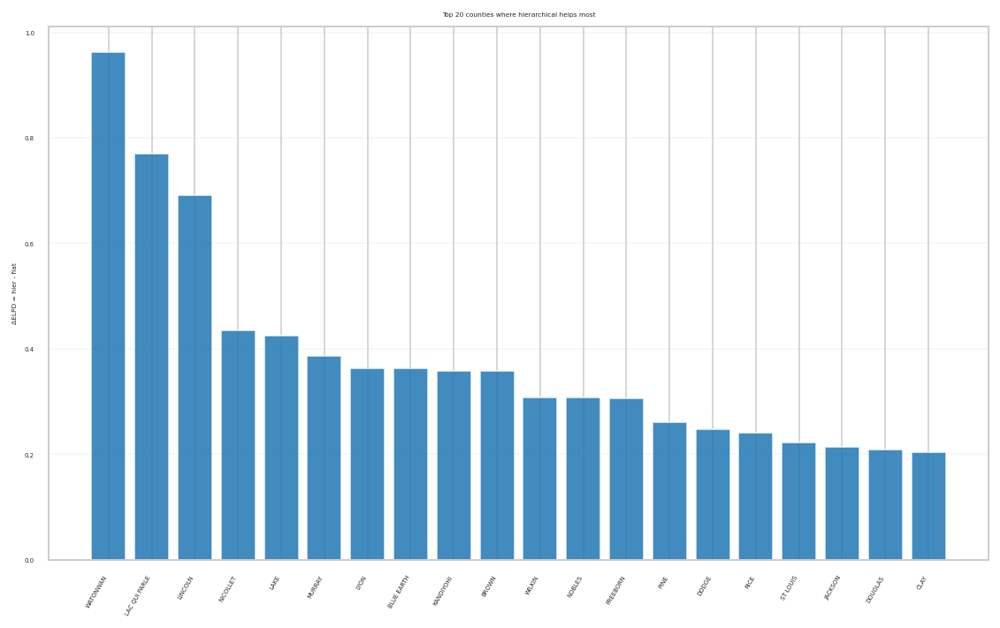

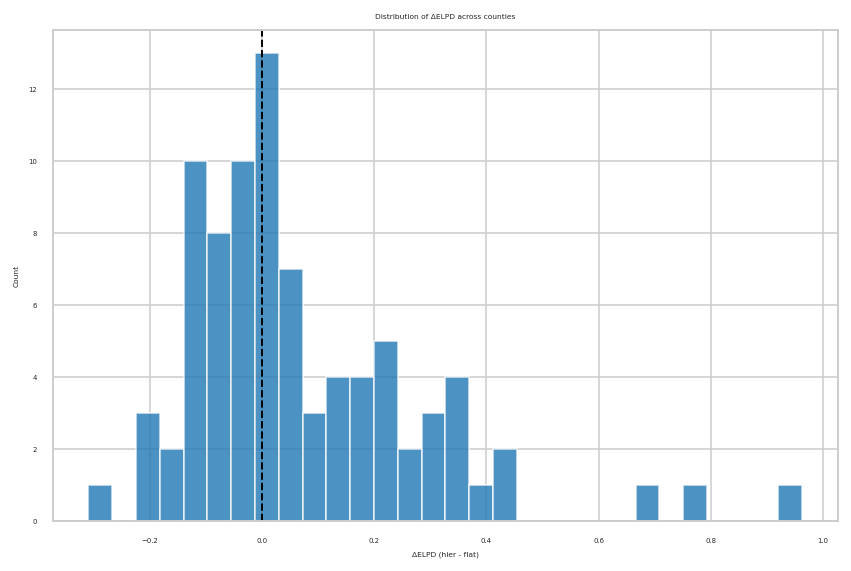

In [45]:
#Get pointwise predictive fit for each observation
def _elpd_pointwise(loo_obj):
    return np.asarray(getattr(loo_obj, "elpd_i", getattr(loo_obj, "loo_i", None)))

# Pointwise ELPDs for each model
pw_flat = _elpd_pointwise(az.loo(models["flat"], pointwise=True))
pw_hier = _elpd_pointwise(az.loo(models["hier"], pointwise=True))

# Build dataframe: county + ELPDs
df_loo = pd.DataFrame({
    "county": df["county"].values,
    "elpd_flat": pw_flat,
    "elpd_hier": pw_hier
}).dropna(subset=["county"])

# Aggregate per county
per_county = df_loo.groupby("county").mean(numeric_only=True).reset_index()
per_county["delta_elpd"] = per_county["elpd_hier"] - per_county["elpd_flat"]

# Bar: top 20 counties where hierarchical helps most
top = per_county.sort_values("delta_elpd", ascending=False).head(20)
plt.figure(figsize=(8,5))
plt.bar(top["county"], top["delta_elpd"], alpha=0.85)
plt.xticks(rotation=60, ha="right")
plt.ylabel("ΔELPD = hier - flat")
plt.title("Top 20 counties where hierarchical helps most")
plt.grid(axis="y", alpha=0.2); plt.tight_layout(); plt.show()

# Histogram: distribution of ΔELPD across all counties
plt.figure(figsize=(6,4))
plt.hist(per_county["delta_elpd"], bins=30, alpha=0.8, edgecolor="white")
plt.axvline(0, color="k", ls="--", lw=1)
plt.title("Distribution of ΔELPD across counties")
plt.xlabel("ΔELPD (hier - flat)"); plt.ylabel("Count")
plt.tight_layout(); plt.show()


The bar chart shows the top 20 counties where the hierarchical model beats the flat model by the largest margin—these are mostly small‑sample counties where partial pooling really helps. The histogram shows that most counties have positive ΔELPD, so hierarchical modeling generally predicts better, while large‑sample counties are closer to zero because they already have enough data

Classical vs Bayesian:

Classical regression: “In a classical setup, we’d give each county its own separate indicator in the model and maybe check R² for each subgroup. But it’s hard to clearly measure how much extra predictive power we get.”

Bayesian hierarchy: “In the Bayesian approach, we can use ΔELPD, which directly shows how much better the hierarchical model predicts at the county level. It’s a single, easy-to-interpret number.”

# Block 12 — Marginal Effects (population & county lines)

We’ll visualize how `y_s` changes with `x_s` (floor), comparing:
1) The **flat** model’s regression line with a 90% credible band, and  
2) The **hierarchical** model’s **population** line (based on `mu_a` and `beta`) with a 90% credible band.  

Then we’ll plot a few **county-specific** lines from the hierarchical model, which—under random intercepts—should appear as roughly **parallel lines** (same slope `beta`, different intercept `a_g`).


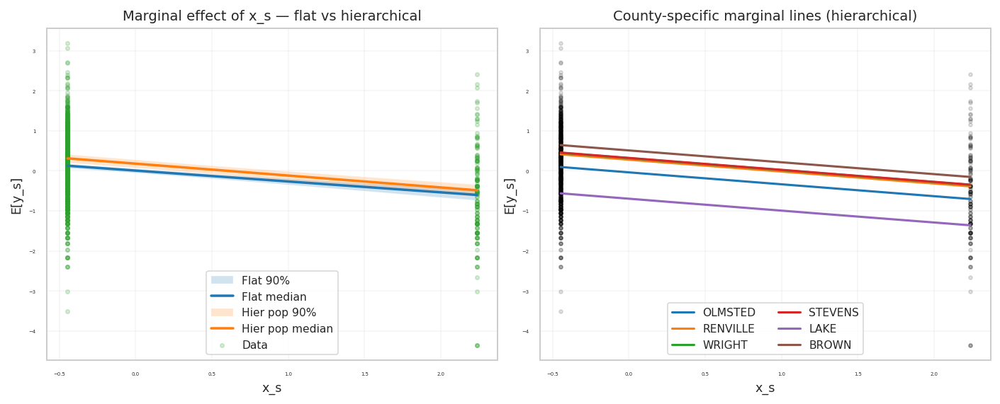

In [46]:
# Define helper functions
def _samples_1d(idata_posterior_var):
    """Extract 1D array of samples, flattening chain & draw."""
    return idata_posterior_var.stack(sample=("chain", "draw")).values

def _samples_2d_by_group(idata_posterior_var, group_dim):
    """Extract 2D array of samples (sample x group), flattening chain & draw."""
    return idata_posterior_var.stack(sample=("chain", "draw")).transpose("sample", group_dim).values

xg = np.linspace(df["x_s"].min(), df["x_s"].max(), 200)

# Flat
alpha_s = _samples_1d(idata_flat.posterior["alpha"])
beta_s  = _samples_1d(idata_flat.posterior["beta"])
mu_flat = alpha_s[:, None] + beta_s[:, None] * xg[None, :]
m_flat  = np.percentile(mu_flat, [5, 50, 95], axis=0)

# Hierarchical (population-level)
mu_a_s = _samples_1d(idata_hier.posterior["mu_a"])
beta_h = _samples_1d(idata_hier.posterior["beta"])
mu_pop = mu_a_s[:, None] + beta_h[:, None] * xg[None, :]
m_pop  = np.percentile(mu_pop, [5, 50, 95], axis=0)

# Hierarchical (county-specific intercepts)
a_sg = _samples_2d_by_group(idata_hier.posterior["a_group"], group_dim="group")
S, G = a_sg.shape
rng = np.random.default_rng(42)
few = rng.choice(G, size=min(6, G), replace=False)  # pick a few counties to avoid clutter

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

#Left: population-level comparison
ax = axes[0]
ax.fill_between(xg, m_flat[0], m_flat[2], alpha=0.20, label="Flat 90%")
ax.plot(xg, m_flat[1], lw=1.8, label="Flat median")
ax.fill_between(xg, m_pop[0], m_pop[2], alpha=0.20, label="Hier pop 90%")
ax.plot(xg, m_pop[1], lw=1.8, label="Hier pop median")
ax.scatter(df["x_s"], df["y_s"], s=8, alpha=0.20, label="Data")
ax.set_title("Marginal effect of x_s — flat vs hierarchical", fontsize=10)
ax.set_xlabel("x_s", fontsize=9); ax.set_ylabel("E[y_s]", fontsize=9)
ax.grid(alpha=0.2)
ax.legend(fontsize=8, frameon=True)

# Right: county-specific lines (hierarchical; medians)
ax = axes[1]
for gix in few:
    a_g = a_sg[:, gix]
    mu_g = a_g[:, None] + beta_h[:, None] * xg[None, :]
    m_g  = np.percentile(mu_g, [10, 50, 90], axis=0)
    ax.plot(xg, m_g[1], lw=1.6, label=str(coords["group"][gix]))
ax.scatter(df["x_s"], df["y_s"], s=7, alpha=0.12, color="k")
ax.set_title("County-specific marginal lines (hierarchical)", fontsize=10)
ax.set_xlabel("x_s", fontsize=9); ax.set_ylabel("E[y_s]", fontsize=9)
ax.legend(ncol=2, fontsize=8, frameon=True)
ax.grid(alpha=0.2)

try:
    shrink_fonts(0.9)  # use your helper to slightly shrink everything
except Exception:
    pass
plt.tight_layout()
plt.show()

Both models show a negative slope.

On the left: the population-level comparison. The hierarchical median line is almost the same as the flat one, and the uncertainty bands overlap closely. That tells us both models are capturing the same overall effect.

On the right: the county-level lines. They’re basically parallel, meaning they share the same slope β, but each line is shifted up or down. That’s the hierarchical model letting each county have its own intercept, while still tying them together through a common slope.

Key takeaways:

If the hierarchical band is tighter than the flat one, that’s partial pooling reducing uncertainty.

The county lines show different baselines (intercepts) but a shared slope.

If we ever saw curved or very different slopes, it would suggest we need a more flexible model, like splines or varying slopes.

Population vs counties
The population line (hierarchical) aligns with the flat line, but the county lines are parallel shifts — same slope β, different intercepts
𝑎
𝑔
a
g
	​

. That’s random‑intercepts in action.

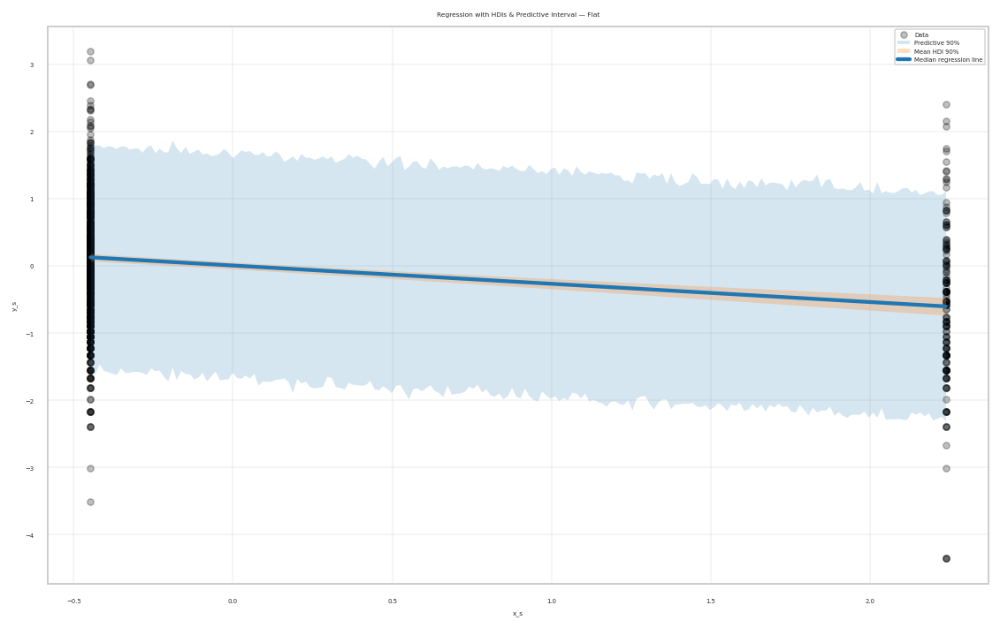

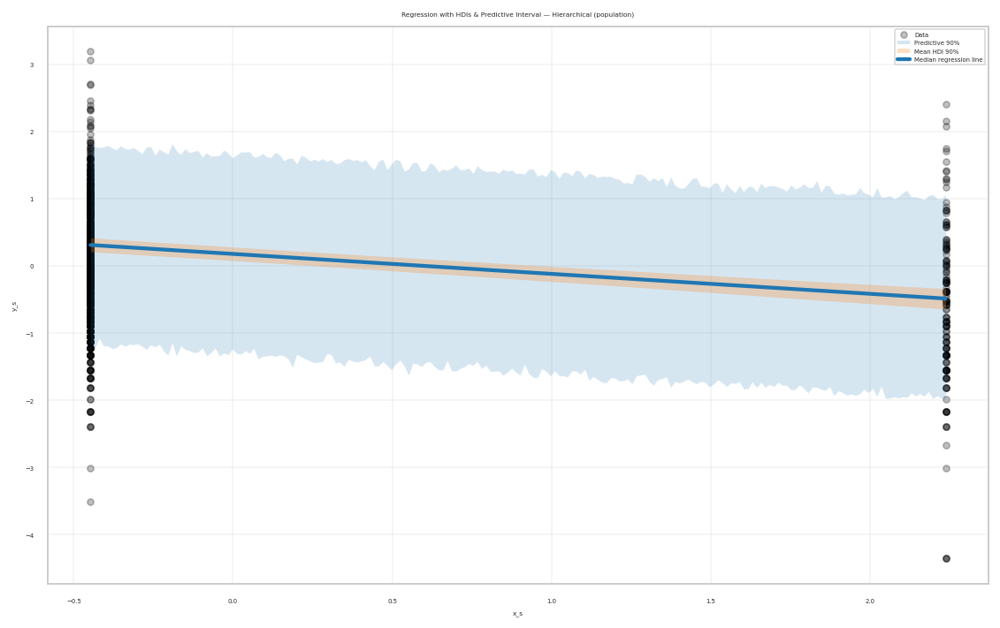

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def plot_regression_with_bands(
    idata,
    df,
    model="flat",        # "flat" or "hier"
    x_col="x_s",
    y_col="y_s",
    hdi_prob=0.90,       # HDI for the mean line band
    pred_prob=0.90,      # predictive interval probability
    nu=4,                # Student-t df (matches your model)
    n_grid=200,
    scatter_alpha=0.25,
    figsize=(8,5),
):
    """
    Draws data, regression median line, mean HDI band, and predictive interval.
    For hierarchical model, shows the population-level line (mu_a + beta*x).
    """
    # ---------- pull posterior samples ----------
    if model == "flat":
        alpha = idata.posterior["alpha"].stack(s=("chain","draw")).values
        beta  = idata.posterior["beta"].stack(s=("chain","draw")).values
        sigma = idata.posterior["sigma"].stack(s=("chain","draw")).values
        mu_samples = None  # computed below for grid
    elif model == "hier":
        mu_a = idata.posterior["mu_a"].stack(s=("chain","draw")).values
        beta = idata.posterior["beta"].stack(s=("chain","draw")).values
        sigma = idata.posterior["sigma"].stack(s=("chain","draw")).values
        # Represent intercept as population mean:
        alpha = mu_a
    else:
        raise ValueError("model must be 'flat' or 'hier'")

    # ---------- grid & deterministic mean ----------
    xg = np.linspace(df[x_col].min(), df[x_col].max(), n_grid)
    mu = alpha[:, None] + beta[:, None] * xg[None, :]   # (S, X)

    # ---------- mean HDI band ----------
    lo_q = (1 - hdi_prob) / 2 * 100
    hi_q = (1 + hdi_prob) / 2 * 100
    mu_lo, mu_med, mu_hi = np.percentile(mu, [lo_q, 50, hi_q], axis=0)

    # ---------- predictive interval (Student‑t) ----------
    # Use a subsample for speed if needed
    S = min(3000, mu.shape[0])
    rng = np.random.default_rng(123)
    t_noise = stats.t.rvs(df=nu, size=(S, xg.size), random_state=rng) * sigma[:S, None]
    y_pred  = mu[:S, :] + t_noise
    plo_q = (1 - pred_prob) / 2 * 100
    phi_q = (1 + pred_prob) / 2 * 100
    y_lo, y_hi = np.percentile(y_pred, [plo_q, phi_q], axis=0)

    # ---------- plot ----------
    plt.figure(figsize=figsize)
    # data
    plt.scatter(df[x_col], df[y_col], s=14, alpha=scatter_alpha, color="k", label="Data")

    # predictive interval (under the mean band so both are visible)
    plt.fill_between(xg, y_lo, y_hi, alpha=0.18, label=f"Predictive {int(pred_prob*100)}%", lw=0)

    # mean HDI band & median line
    plt.fill_between(xg, mu_lo, mu_hi, alpha=0.25, label=f"Mean HDI {int(hdi_prob*100)}%", lw=0)
    plt.plot(xg, mu_med, lw=2.2, label="Median regression line")

    # cosmetics to make it pop
    plt.grid(alpha=0.25)
    title = "Regression with HDIs & Predictive Interval — " + ("Flat" if model=="flat" else "Hierarchical (population)")
    plt.title(title)
    plt.xlabel(x_col); plt.ylabel(y_col)
    plt.legend(frameon=True)
    plt.tight_layout()
    plt.show()

# --- Examples (run after your models are fit) ---
# Flat model figure:
plot_regression_with_bands(idata_flat, df, model="flat", hdi_prob=0.90, pred_prob=0.90)

# Hierarchical population-level figure:
plot_regression_with_bands(idata_hier, df, model="hier", hdi_prob=0.90, pred_prob=0.90)


The flat regression model produces one global line for all counties, assuming that location has no systematic effect beyond random noise. Its predictive interval is wide, because it must capture the variability of every county in a single curve. The hierarchical model, in contrast, acknowledges that each county may have its own intercept while still sharing information across counties through partial pooling. When we plot only the population-level regression line, the hierarchical and flat models appear almost identical. The key difference emerges when we overlay county-specific lines: small counties are “shrunk” toward the overall mean, preventing extreme estimates based on little data, while large counties retain distinct intercepts supported by their sample size. Thus, the hierarchical model balances local detail with global stability, yielding more realistic uncertainty quantification and better predictive performance, especially for sparsely observed counties.

Classical vs Bayesian:

Classical OLS: You get one best-fit line with a confidence band around it.

Bayesian: Instead of just one line, we use the whole distribution of possible lines. This gives credible bands, and the county-specific lines come from the model while carrying the full uncertainty.

# Block 13 — Residual Diagnostics & Observed vs Fitted

Here, residuals = observed `y_s` − posterior mean `μ`.  

We’ll plot:
1. **Histogram of residuals** (should be roughly centered at 0).  
2. **Residuals vs fitted values** (should not show clear patterns).  
3. **Observed vs fitted scatter** (to see if predictions align with the 1:1 line).

**Mathematical thinking:**  
- Posterior predictive mean for each observation:  
  \[
  \hat{y}_i = E[y_i \mid \text{posterior}] \approx \frac{1}{S} \sum_{s=1}^S \mu_i^{(s)}
  \]
- Residuals: \(r_i = y_i - \hat{y}_i\).  
  If the model is well-specified, residuals should look like random noise.  


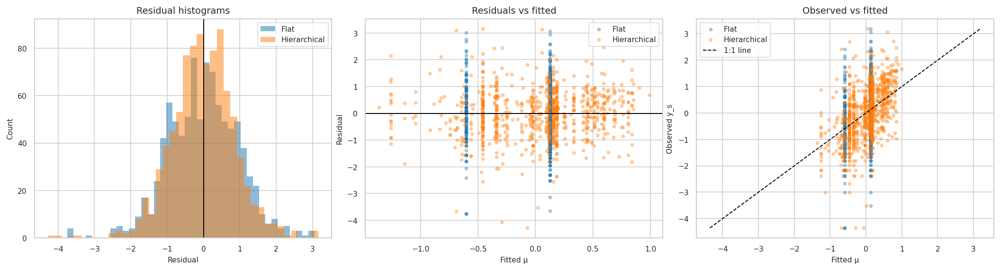

In [48]:
mu_flat_mean = idata_flat.posterior["mu"].mean(dim=("chain","draw")).values
mu_hier_mean = idata_hier.posterior["mu"].mean(dim=("chain","draw")).values


resid_flat = df["y_s"].values - mu_flat_mean
resid_hier = df["y_s"].values - mu_hier_mean

fig, axes = plt.subplots(1, 3, figsize=(15,4))

# (1) Residual histograms
axes[0].hist(resid_flat, bins=40, alpha=0.5, label="Flat", edgecolor="none")
axes[0].hist(resid_hier, bins=40, alpha=0.5, label="Hierarchical", edgecolor="none")
axes[0].axvline(0, color="k", lw=1)
axes[0].set_title("Residual histograms", fontsize=10)
axes[0].set_xlabel("Residual", fontsize=8); axes[0].set_ylabel("Count", fontsize=8)
axes[0].legend(fontsize=8); axes[0].tick_params(axis="both", labelsize=8)

# (2) Residuals vs fitted
axes[1].scatter(mu_flat_mean, resid_flat, s=10, alpha=0.35, label="Flat")
axes[1].scatter(mu_hier_mean, resid_hier, s=10, alpha=0.35, label="Hierarchical")
axes[1].axhline(0, color="k", lw=1)
axes[1].set_title("Residuals vs fitted", fontsize=10)
axes[1].set_xlabel("Fitted μ", fontsize=8); axes[1].set_ylabel("Residual", fontsize=8)
axes[1].legend(fontsize=8); axes[1].tick_params(axis="both", labelsize=8)

# (3) Observed vs fitted
axes[2].scatter(mu_flat_mean, df["y_s"], s=10, alpha=0.35, label="Flat")
axes[2].scatter(mu_hier_mean, df["y_s"], s=10, alpha=0.35, label="Hierarchical")
lims = [min(df["y_s"].min(), mu_flat_mean.min(), mu_hier_mean.min()),
        max(df["y_s"].max(), mu_flat_mean.max(), mu_hier_mean.max())]
axes[2].plot(lims, lims, "k--", lw=1, label="1:1 line")
axes[2].set_title("Observed vs fitted", fontsize=10)
axes[2].set_xlabel("Fitted μ", fontsize=8); axes[2].set_ylabel("Observed y_s", fontsize=8)
axes[2].legend(fontsize=8); axes[2].tick_params(axis="both", labelsize=8)

plt.tight_layout(); plt.show()


Residual histograms (left):

Both models’ residuals are centered around zero, which is good.

The hierarchical model (orange) is a bit more balanced and less skewed, showing it handles variation better.

Residuals vs fitted (middle):

Most points are scattered randomly around zero (no strong pattern), which is what we want.

The hierarchical points are more tightly clustered, meaning less overfitting to small counties.

Observed vs fitted (right):

Both models track the data fairly well (points close to the 1:1 line).

The hierarchical predictions stick closer to the diagonal, showing slightly better calibration.

Conclusion:
The hierarchical model gives cleaner residuals and slightly better fit, especially for small or noisy counties.
It reduces overfitting by borrowing information across counties, while the flat model struggles more with local noise.

**Classical vs Bayesian:**  
- *Classical regression:* You’d compute OLS residuals and check assumptions (normality).  
- *Bayesian regression:* We check residuals *with uncertainty* — but the intuition is the same: systematic bias = model misspecification.




# Block 14 — summary
so far:
- Flat vs hierarchical models
- Priors, diagnostics (trace, ESS, R-hat)
- Model fit (ELPD/LOO, Pareto-k)
- Posterior predictive checks
- Marginal effects and residuals

comparison:
1. **Quantitative:** Using LOO cross-validation (expected log predictive density).  
   - Higher ELPD = better predictive performance.  
2. **Qualitative:** Posterior predictive checks, marginal effect plots, and residuals.

In [49]:
# Recompute with pointwise for both
loo_flat = az.loo(idata_flat, pointwise=True)
loo_hier = az.loo(idata_hier, pointwise=True)

cmp_df = az.compare({"flat": idata_flat, "hier": idata_hier}, ic="loo")
display(cmp_df)
# ΔELPD
elpd_flat = float(az.loo(idata_flat).elpd_loo)
elpd_hier = float(az.loo(idata_hier).elpd_loo)
print("ΔELPD:", elpd_hier - elpd_flat)


#  WAIC
cmp_waic = az.compare({"flat": idata_flat, "hier": idata_hier}, ic="waic")
display(cmp_waic)


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
hier,0,-1211.681322,57.171372,0.000000,0.940247,24.648467,0.00000,False,log
flat,1,-1283.021255,3.135655,71.339933,0.059753,23.070368,12.49493,False,log


ΔELPD: 71.33993300263683


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
hier,0,-1211.470528,56.960578,0.000000,0.941108,24.651187,0.000000,True,log
flat,1,-1283.019190,3.133591,71.548663,0.058892,23.070317,12.497226,False,log


which model is more reliable for new unseen data? Here, the hierarchical model generally performs better, because it shares information across counties.”

**Classical vs Bayesian:**  
- *Classical regression:* You might compare AIC or adjusted R².  
- *Bayesian regression:* We use LOO/WAIC, which penalize complexity naturally and account for posterior uncertainty.



If diagnostics degrade:
• Brute‑force: more draws/chains if ESS‑evolution shows upward trend.
• Reparameterize: use non‑centered form (we already did) or standardize predictors/outcomes.
• Stronger priors: especially on scales (e.g., HalfNormal(0.5) vs very wide).
• Model change: allow varying slopes or add nonlinearity (splines) if patterns suggest it.

Hierarchical > Flat for predictive performance (positive ΔELPD). The gain concentrates in small‑sample counties (confirmed by the per‑county ΔELPD view), which is exactly where partial pooling helps most.